In [2]:
from HeaderP import *

In [3]:
df = pd.read_csv('exo_comb_periods_age.csv')
cond = pd.read_csv('Element_Tcond.csv')

In [4]:
df = df.dropna(subset=['Prot_comb']).reset_index(drop=True)

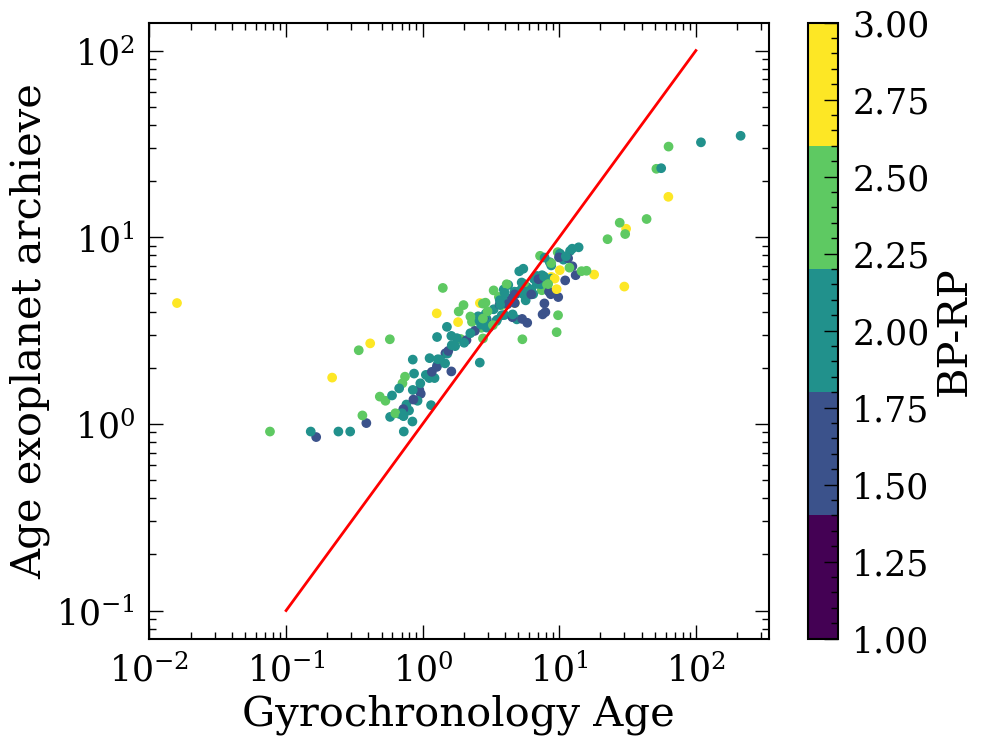

In [5]:
plt.figure(figsize=(10,8))
plt.scatter(df['age_fit_ind'], df['Age'], c=df['bp_rp'],
           vmin=1, vmax=3, cmap=plt.get_cmap('viridis', 5))
plt.xscale('log')
plt.yscale('log')
plt.plot([0.1, 100], [0.1, 100], 'r-')
plt.xlabel('Gyrochronology Age')
plt.ylabel('Age exoplanet archieve')
plt.colorbar(label='BP-RP')

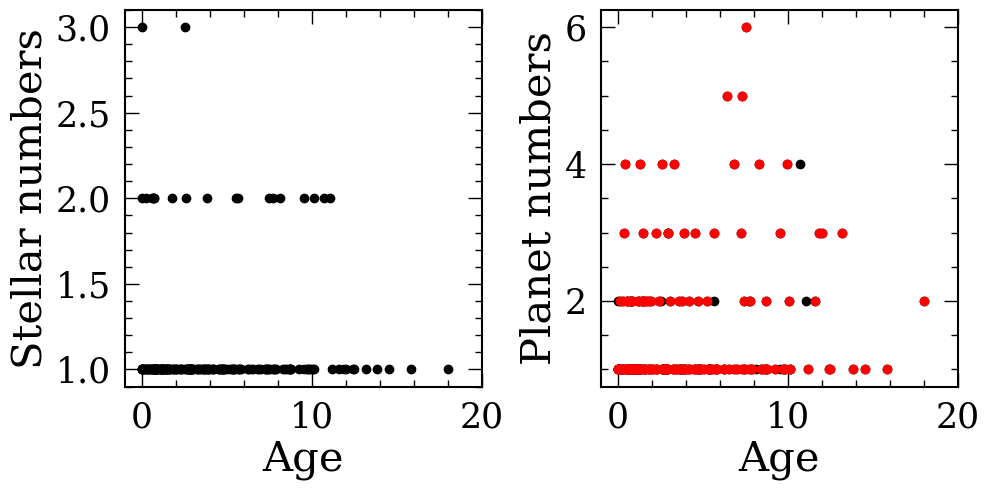

In [6]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.plot((df['age_fit_ind']), df['sy_snum'], 'ko')
plt.xlim([-1,20])
plt.xlabel('Age')
plt.ylabel('Stellar numbers')

plt.subplot(1,2,2)
plt.plot((df['age_fit_ind']), df['sy_pnum'], 'ko')
m = (df['sy_snum']==1)
plt.plot((df['age_fit_ind'])[m], df['sy_pnum'][m], 'ro')
plt.xlim([-1,20])
plt.xlabel('Age')
plt.ylabel('Planet numbers')
plt.tight_layout()

In [7]:
"""ipl3 = load_mwm_ipl3()
ipl3_gyroage = pd.merge(ipl3, pd.read_csv('../JzKineAge/DataFiles/Age_ztf_tess.csv'),
                       left_on='gaia_dr3_source_id', right_on='source_id', how='inner')
print(len(ipl3_gyroage))
ipl3_planet = pd.merge(ipl3, df, left_on='gaia_dr2_source_id', right_on='source_id',
                      how='inner')
len(ipl3_planet)"""

"ipl3 = load_mwm_ipl3()\nipl3_gyroage = pd.merge(ipl3, pd.read_csv('../JzKineAge/DataFiles/Age_ztf_tess.csv'),\n                       left_on='gaia_dr3_source_id', right_on='source_id', how='inner')\nprint(len(ipl3_gyroage))\nipl3_planet = pd.merge(ipl3, df, left_on='gaia_dr2_source_id', right_on='source_id',\n                      how='inner')\nlen(ipl3_planet)"

In [8]:
#ipl3_gyroage.to_csv('ipl3_gyro.csv', index=False)
#ipl3_planet.to_csv('ipl3_gyro_planet.csv', index=False)
ipl3_gyroage = pd.read_csv('ipl3_gyro.csv')
ipl3_planet = pd.read_csv('ipl3_gyro_planet.csv')
ipl3_planet = ipl3_planet.drop_duplicates(subset=['gaia_dr3_source_id'], keep='first')

/var/folders/w0/h14c78gj4rs91wsbcjh87y2m0000gn/T/ipykernel_12316/4167443954.py:3: DtypeWarning: Columns (45) have mixed types. Specify dtype option on import or set low_memory=False.
  ipl3_gyroage = pd.read_csv('ipl3_gyro.csv')


In [137]:
"""abund_cols = ['m_h_atm', 'alpha_m_atm', 'c_m_atm', 'n_m_atm', 
             'al_h', 'c_12_13', 'ca_h', 'ce_h', 
             'c_h', 'co_h', 'cr_h', 'cu_h', 'fe_h', 'k_h', 'mg_h', 
             'na_h', 'nd_h', 'ni_h', 'n_h', 'o_h', 'p_h', 'si_h', 's_h',
             'ti_h', 'v_h']
abund_cols_err = ['e_m_h_atm', 'e_alpha_m_atm', 'e_c_m_atm', 'e_n_m_atm',
                 'e_al_h', 'e_c_12_13', 'e_ca_h', 'e_ce_h', 
                 'e_c_h', 'e_co_h', 'e_cr_h', 'e_cu_h', 'e_fe_h',
                 'e_k_h', 'e_mn_h', 'e_na_h', 'e_nd_h', 'e_ni_h',
                 'e_n_h', 'e_o_h', 'e_p_h', 'e_si_h', 'e_s_h', 'e_ti_h',
                 'e_v_h']"""
abund_cols = ['m_h_atm', 
             'al_h', 'c_12_13', 'ca_h', 'ce_h', 
             'c_h', 'co_h', 'cr_h', 'cu_h', 'fe_h', 'k_h', 'mg_h', 
             'na_h', 'nd_h', 'ni_h', 'n_h', 'o_h', 'p_h', 'si_h', 's_h',
             'ti_h', 'v_h']

atomic_numbers = np.array([0, 13, 6, 20, 58, 6, 27, 24, 29, 26, 19, 12, 11, 60, 28, 7, 8, 15, 14, 16, 22, 23])
print(len(atomic_numbers), len(abund_cols))
abund_cols_err = ['e_m_h_atm', 
                 'e_al_h', 'e_c_12_13', 'e_ca_h', 'e_ce_h', 
                 'e_c_h', 'e_co_h', 'e_cr_h', 'e_cu_h', 'e_fe_h',
                 'e_k_h', 'e_mn_h', 'e_na_h', 'e_nd_h', 'e_ni_h',
                 'e_n_h', 'e_o_h', 'e_p_h', 'e_si_h', 'e_s_h', 'e_ti_h',
                 'e_v_h']

col_to_keep = np.append(abund_cols, abund_cols_err)
col_to_keep = np.append(col_to_keep, ['logg', 'teff', 'age_fit_ind'])
def find_doppleganger(ipl3_planet, ipl3_gyroage):
    def get_bool(x_comp, x_comp_err, x, x_err):
        return (((x_comp-x_comp_err)>(x-x_err))&((x_comp+x_comp_err)<(x+x_err)))
    count = 0
    ndata = 0
    for i in range(len(ipl3_planet)):
        pt_single = ipl3_planet.iloc[i]
        planet_feh = pt_single['fe_h']
        #planet_feh_err = pt_single['e_fe_h']
        planet_feh_err = 0.05
        planet_logg = pt_single['logg']
        #planet_logg_err = pt_single['e_logg']
        planet_logg_err = 0.2
        planet_teff = pt_single['teff']
        #planet_teff_err = pt_single['e_teff']
        planet_teff_err = 50
        planet_age = pt_single['age_fit_ind']
        #planet_age_err_p = pt_single['age_fit_ind_p']
        #planet_age_err_m = pt_single['age_fit_ind_m']
        #planet_age_err = np.mean([abs(planet_age_err_p), abs(planet_age_err_m)])
        planet_age_err = 20
        
        m_feh = get_bool(ipl3_gyroage['fe_h'].values, ipl3_gyroage['e_fe_h'].values, planet_feh, planet_feh_err)
        m_teff = get_bool(ipl3_gyroage['teff'].values, ipl3_gyroage['e_teff'].values, planet_teff, planet_teff_err)
        m_logg = get_bool(ipl3_gyroage['logg'].values, ipl3_gyroage['e_logg'].values, planet_logg, planet_logg_err)
        m_age = get_bool(ipl3_gyroage['age_fit_ind'].values, ipl3_gyroage['age_fit_ind_err_p'].values, planet_age, planet_age_err)
        
        m = ((m_feh&m_teff)&(m_logg&m_age))
        if planet_age==planet_age:
            if sum(m)==0:
                ndata = ndata+1
        if count == 0:
            ipl3_gyroage_dg = ipl3_gyroage[m][col_to_keep]
            ipl3_gyroage_dg['pl_source_id'] = int(pt_single['gaia_dr3_source_id'])
            count = 1
        else:
            ipl3_gyroage_dg_new = ipl3_gyroage[m][col_to_keep]
            ipl3_gyroage_dg_new['pl_source_id'] = int(pt_single['gaia_dr3_source_id'])
            ipl3_gyroage_dg = pd.concat([ipl3_gyroage_dg, ipl3_gyroage_dg_new])
    print(ndata, len(ipl3_planet.dropna(subset=['age_fit_ind'])))
    return ipl3_gyroage_dg.groupby('pl_source_id', as_index=False).mean()

22 22


In [131]:
ipl3_gyroage_dg = find_doppleganger(ipl3_planet, ipl3_gyroage)
ipl3_planet_dg = ipl3_planet.loc[ipl3_planet['gaia_dr3_source_id'].isin(ipl3_gyroage_dg['pl_source_id'])]
len(ipl3_gyroage_dg), len(ipl3_planet_dg)

5 71


(66, 66)

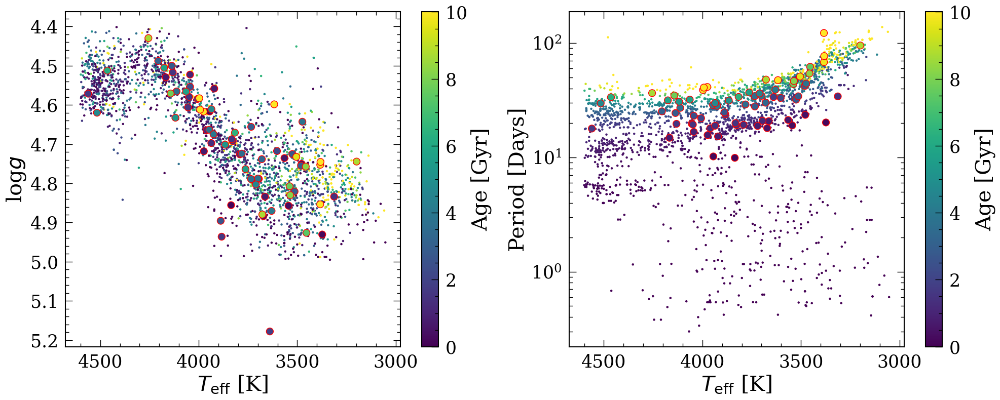

In [132]:
plt.figure(figsize=(20,8))
plt.subplot(1,2,1)
ipl3_gyroage = ipl3_gyroage[ipl3_gyroage['logg']>4.4].reset_index(drop=True)
ipl3_gyroage = ipl3_gyroage[ipl3_gyroage['logg']<5].reset_index(drop=True)
ipl3_planet = ipl3_planet[ipl3_planet['logg']>4.4].reset_index(drop=True)
ipl3_gyroage = ipl3_gyroage[ipl3_gyroage['teff']<4600].reset_index(drop=True)
ipl3_planet = ipl3_planet[ipl3_planet['teff']<4600].reset_index(drop=True)

plt.scatter(ipl3_gyroage['teff'], ipl3_gyroage['logg'], 
           c=ipl3_gyroage['age_fit_ind'], s=5, vmin=0, vmax=10)
plt.scatter(ipl3_planet.dropna(subset=['age_fit_ind'])['teff'], 
         ipl3_planet.dropna(subset=['age_fit_ind'])['logg'], 
           c=ipl3_planet.dropna(subset=['age_fit_ind'])['age_fit_ind'],
           edgecolor='r', s=100, vmin=0, vmax=10)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.xlabel('$T_{\\rm eff}$ [K]')
plt.ylabel('log$g$')
plt.colorbar(label='Age [Gyr]')


plt.subplot(1,2,2)
plt.scatter(ipl3_gyroage['teff'], ipl3_gyroage['Prot'], 
           c=ipl3_gyroage['age_fit_ind'], s=5, vmin=0, vmax=10)
plt.scatter(ipl3_planet.dropna(subset=['age_fit_ind'])['teff'], 
         ipl3_planet.dropna(subset=['age_fit_ind'])['Prot'], 
           c=ipl3_planet.dropna(subset=['age_fit_ind'])['age_fit_ind'],
           edgecolor='r', s=100, vmin=0, vmax=10)
plt.gca().invert_xaxis()
plt.yscale('log')
plt.xlabel('$T_{\\rm eff}$ [K]')
plt.ylabel('Period [Days]')
plt.colorbar(label='Age [Gyr]')
plt.tight_layout()

/var/folders/w0/h14c78gj4rs91wsbcjh87y2m0000gn/T/ipykernel_12316/763852942.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15, 5))


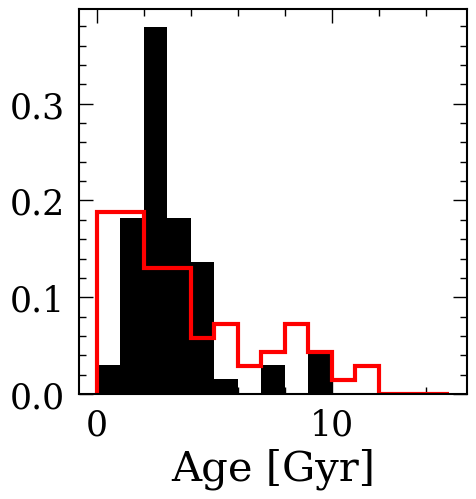

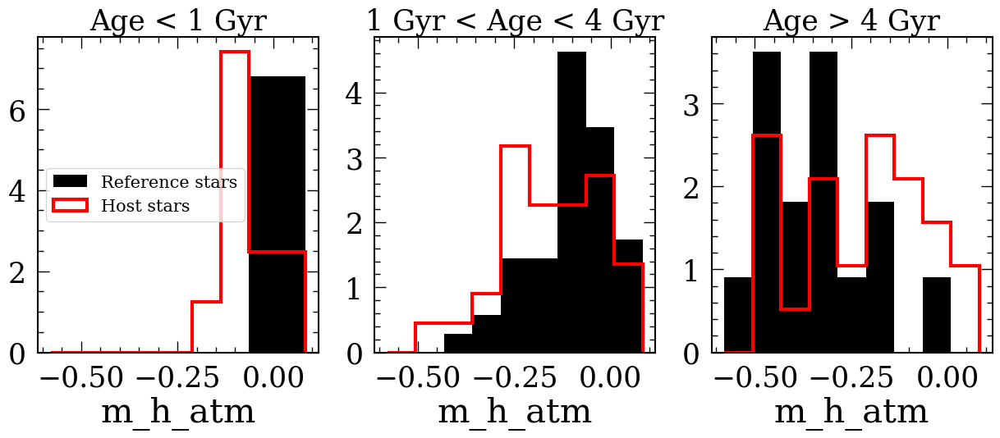

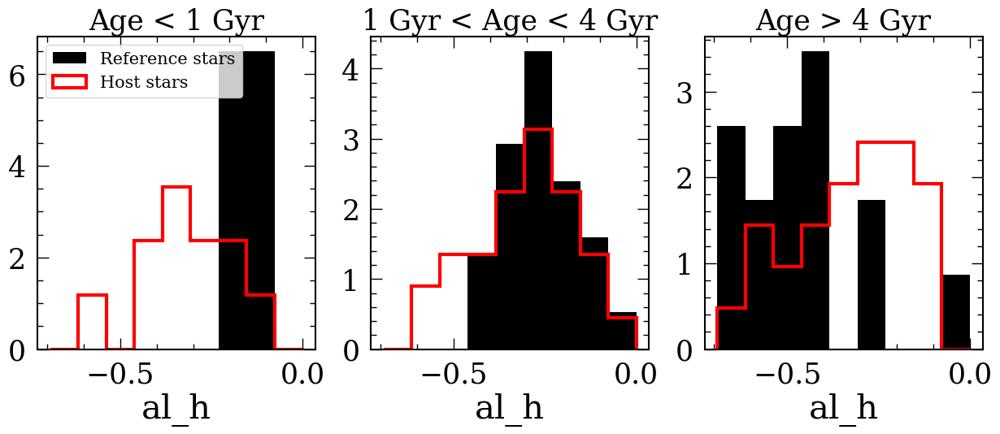

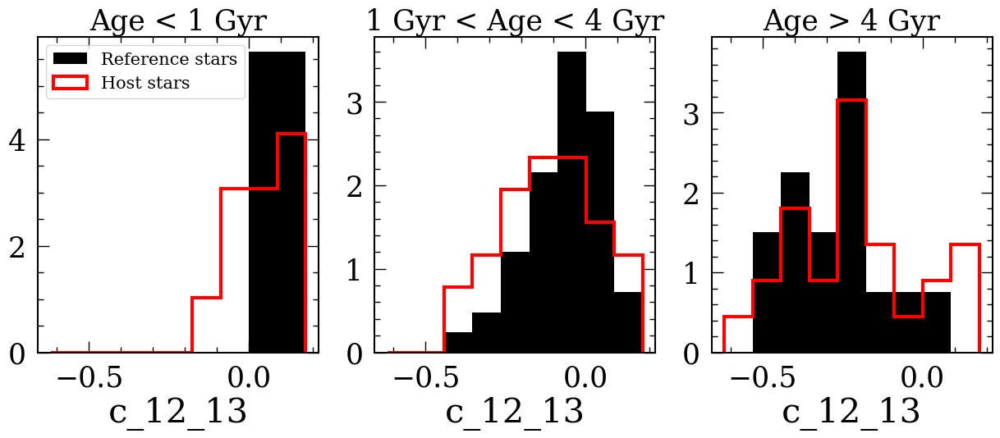

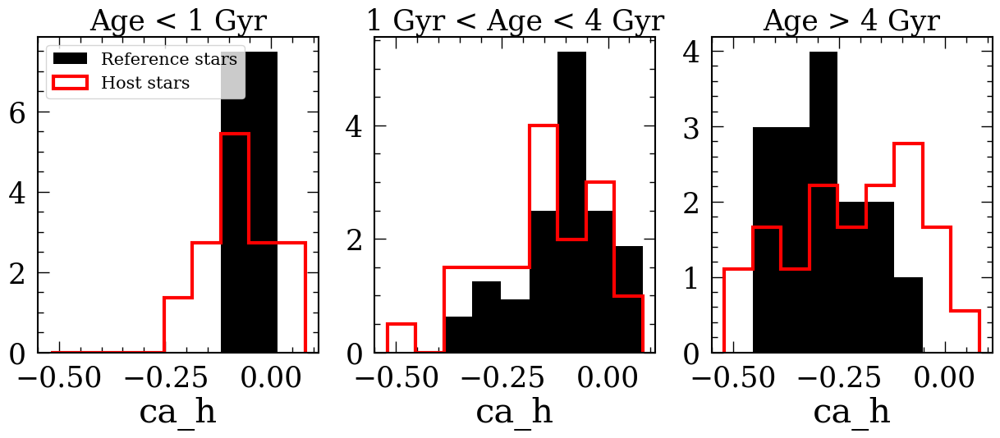

...

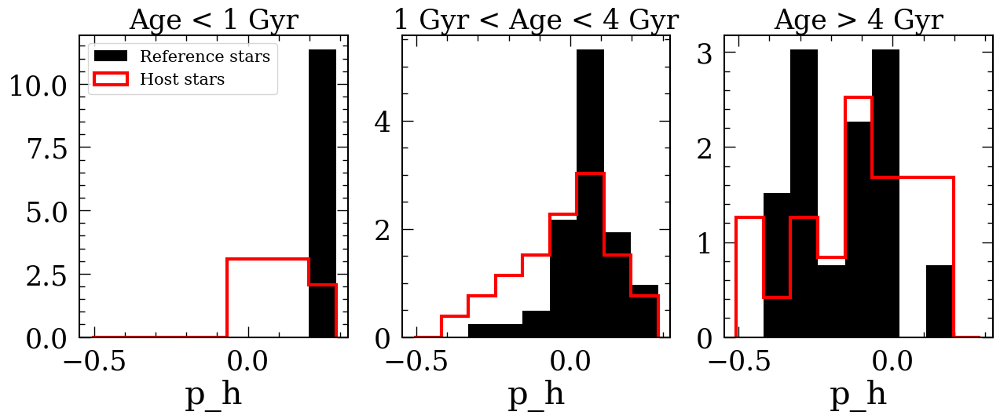

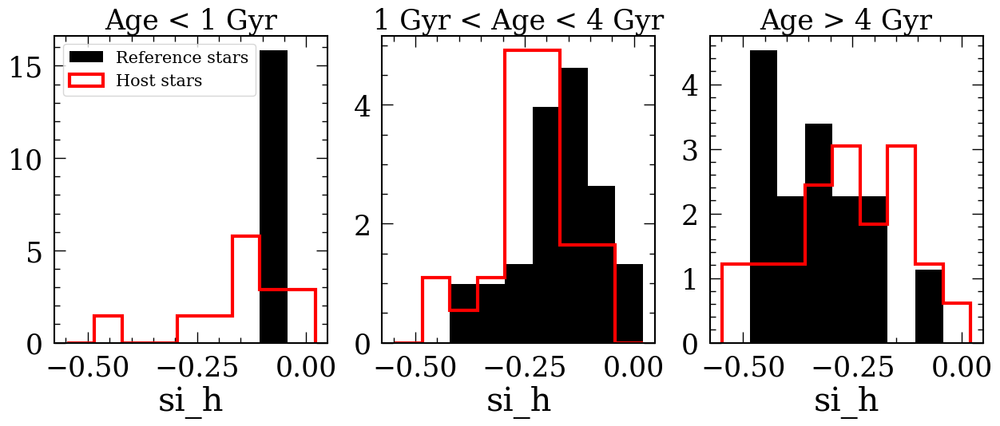

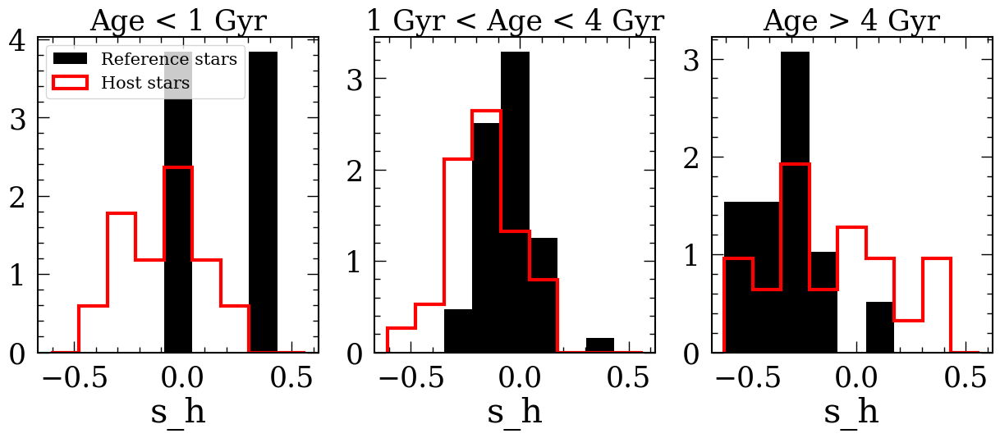

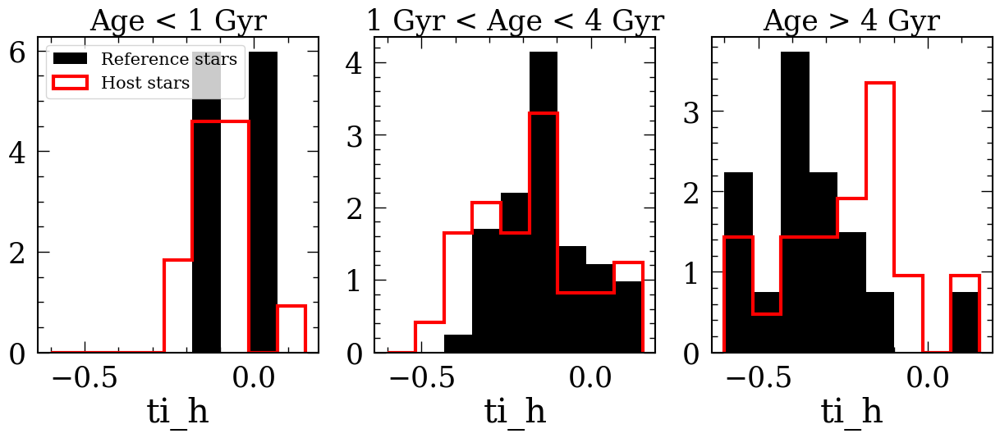

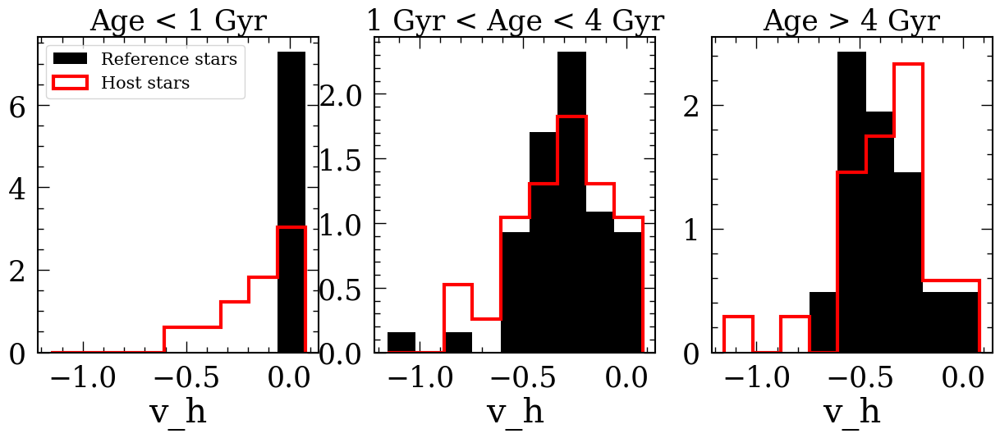

In [97]:
plt.figure(figsize=(5,5))
plt.hist(ipl3_gyroage_dg['age_fit_ind'], bins=np.linspace(0,15,16),
        color='k', density=True)
plt.hist(ipl3_planet['age_fit_ind'], bins=np.linspace(0,15,16),
        color='r', histtype='step', linewidth=3, density=True)
plt.xlabel('Age [Gyr]')

binsizes = 10
counts = 0
for i in range(len(abund_cols)):
    m1 = (ipl3_gyroage_dg['age_fit_ind']<1)
    m2 = ((ipl3_gyroage_dg['age_fit_ind']<4)&(ipl3_gyroage_dg['age_fit_ind']>1))
    m3 = (ipl3_gyroage_dg['age_fit_ind']>4)
    
    m1_pl = (ipl3_planet['age_fit_ind']<1)
    m2_pl = ((ipl3_planet['age_fit_ind']<4)&(ipl3_planet['age_fit_ind']>1))
    m3_pl = (ipl3_planet['age_fit_ind']>4)
    
    m = (ipl3_gyroage_dg[abund_cols[i]]>-5)
    m_pl = (ipl3_planet[abund_cols[i]]>-5)
    
    if sum(m)==0:
        continue
    counts = counts+1
    ymin = min([np.percentile(ipl3_gyroage_dg[abund_cols[i]][m].dropna(), 1),
               np.percentile(ipl3_planet[abund_cols[i]][m_pl].dropna(), 1)])
    ymax = max([np.percentile(ipl3_gyroage_dg[abund_cols[i]][m].dropna(), 95),
               np.percentile(ipl3_planet[abund_cols[i]][m_pl].dropna(), 95)])
    
    
    plt.figure(figsize=(15, 5))
    plt.subplot(1,3,1)
    plt.title('Age < 1 Gyr', fontsize=25)
    plt.hist(ipl3_gyroage_dg[m&m1][abund_cols[i]], 
             bins=np.linspace(ymin,ymax,binsizes),
        color='k', density=True, label='Reference stars')
    plt.hist(ipl3_planet[m_pl&m1_pl][abund_cols[i]], 
             bins=np.linspace(ymin,ymax,binsizes),
            color='r', histtype='step', linewidth=3, density=True,
            label='Host stars')
    plt.xlabel(abund_cols[i])
    plt.legend(frameon=True, fontsize=15, loc=0)
    
    plt.subplot(1,3,2)
    plt.title('1 Gyr < Age < 4 Gyr', fontsize=25)
    plt.hist(ipl3_gyroage_dg[m&m2][abund_cols[i]], 
             bins=np.linspace(ymin,ymax,binsizes),
        color='k', density=True)
    plt.hist(ipl3_planet[m_pl&m2_pl][abund_cols[i]], 
             bins=np.linspace(ymin,ymax,binsizes),
            color='r', histtype='step', linewidth=3, density=True)
    plt.xlabel(abund_cols[i])
    
    plt.subplot(1,3,3)
    plt.title('Age > 4 Gyr', fontsize=25)
    plt.hist(ipl3_gyroage_dg[m&m3][abund_cols[i]], 
             bins=np.linspace(ymin,ymax,binsizes),
        color='k', density=True)
    plt.hist(ipl3_planet[m_pl&m3_pl][abund_cols[i]], 
             bins=np.linspace(ymin,ymax,binsizes),
            color='r', histtype='step', linewidth=3, density=True)
    plt.xlabel(abund_cols[i])

/opt/homebrew/anaconda3/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/homebrew/anaconda3/lib/python3.12/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


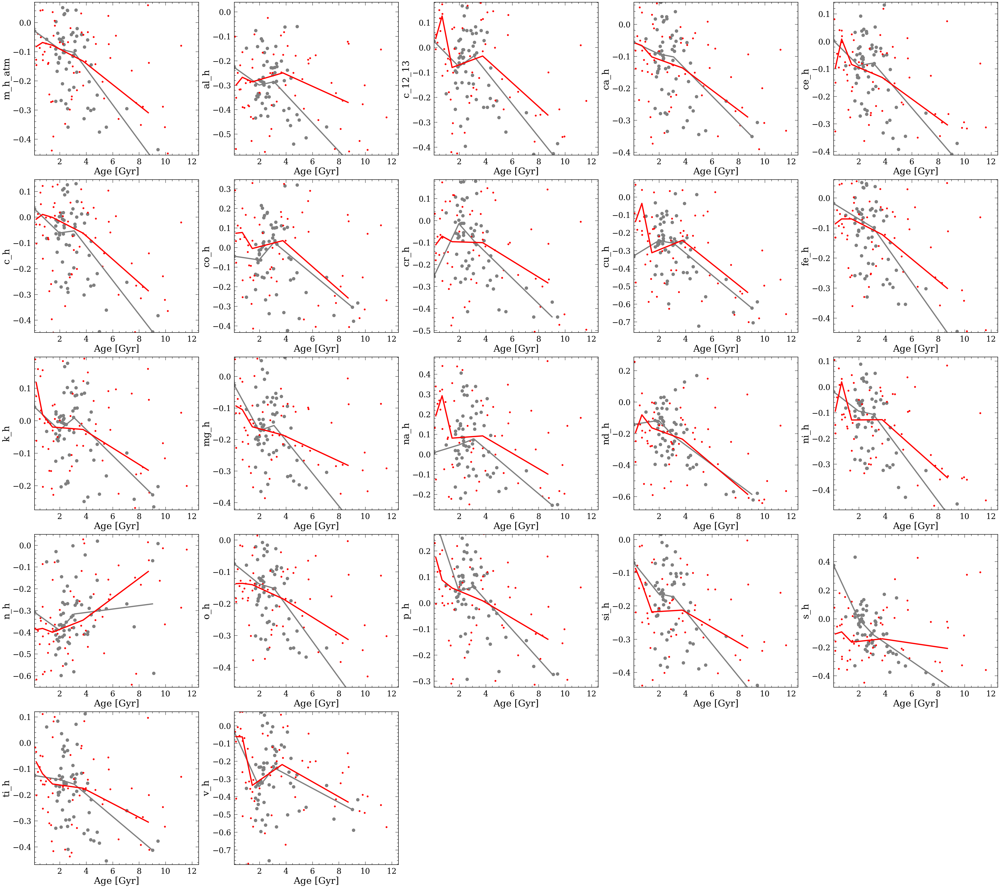

In [ ]:
plt.figure(figsize=(45, 40))
counts = 0
for i in range(len(abund_cols)):
    plt.subplot(5,5,counts+1)
    m = ((ipl3_gyroage_dg[abund_cols[i]]>-5)&(ipl3_gyroage_dg['age_fit_ind']<12.5))
    m_pl = ((ipl3_planet[abund_cols[i]]>-5)&(ipl3_planet['age_fit_ind']<12.5))
    if sum(m)==0:
        continue
        
    ymin = min([np.percentile(ipl3_gyroage_dg[abund_cols[i]][m].dropna(), 5),
               np.percentile(ipl3_planet[abund_cols[i]][m_pl].dropna(), 5)])
    ymax = max([np.percentile(ipl3_gyroage_dg[abund_cols[i]][m].dropna(), 95),
               np.percentile(ipl3_planet[abund_cols[i]][m_pl].dropna(), 95)])
    
    plt.plot(ipl3_gyroage_dg[m]['age_fit_ind'], ipl3_gyroage_dg[m][abund_cols[i]],
            'o', color='grey', ms=10)
    plt.plot(ipl3_planet[m_pl]['age_fit_ind'], ipl3_planet[m_pl][abund_cols[i]],
            '.', color='red', ms=10)
    
    #p = fitpoints(ipl3_gyroage_dg[m]['age_fit_ind'], ipl3_gyroage_dg[m][abund_cols[i]], 1)
    #p_pl = fitpoints(ipl3_planet[m_pl]['age_fit_ind'], ipl3_planet[m_pl][abund_cols[i]], 1)
    #plt.plot([0, 15], p([0, 15]), color='grey', linewidth=2)
    #plt.plot([0, 15], p_pl([0, 15]), 'r-', linewidth=2)
    
    ipl3_gyroage_dg = ipl3_gyroage_dg.sort_values('age_fit_ind')
    x, y = movingMed_time(np.log10(ipl3_gyroage_dg[m]['age_fit_ind']), 
                          ipl3_gyroage_dg[m][abund_cols[i]], 0.5, 0.4)
    plt.plot(np.power(10, x), y, color='grey', linewidth=4)
    
    ipl3_planet = ipl3_planet.sort_values('age_fit_ind')
    x, y = movingMed_time(np.log10(ipl3_planet[m_pl]['age_fit_ind']), 
                          ipl3_planet[m_pl][abund_cols[i]], 0.5, 0.4)
    plt.plot(np.power(10, x), y, 'r-', linewidth=4)
    
    plt.xlabel('Age [Gyr]')
    plt.ylabel(abund_cols[i])
    plt.ylim([ymin, ymax])
    #plt.xscale('log')
    plt.xlim([0.1, 12.5])
    counts = counts+1
    plt.tight_layout()

/var/folders/w0/h14c78gj4rs91wsbcjh87y2m0000gn/T/ipykernel_12316/3914983594.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))


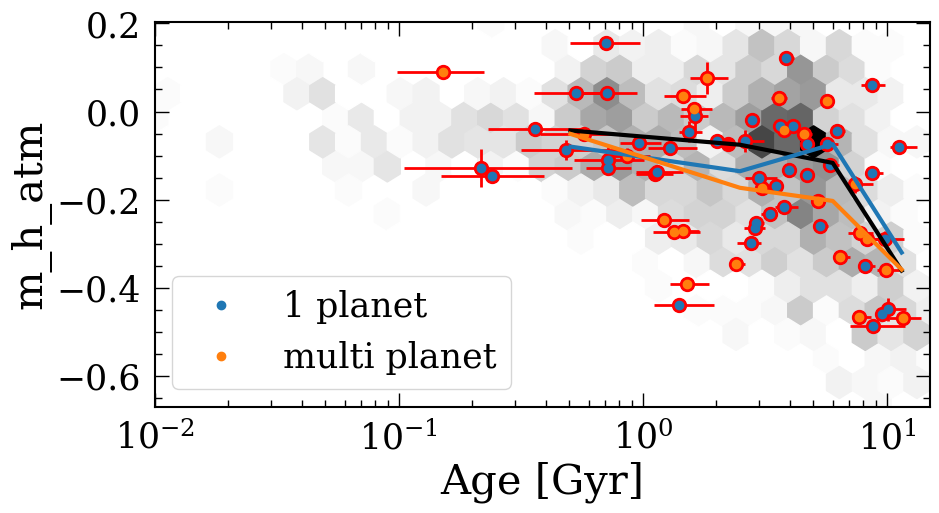

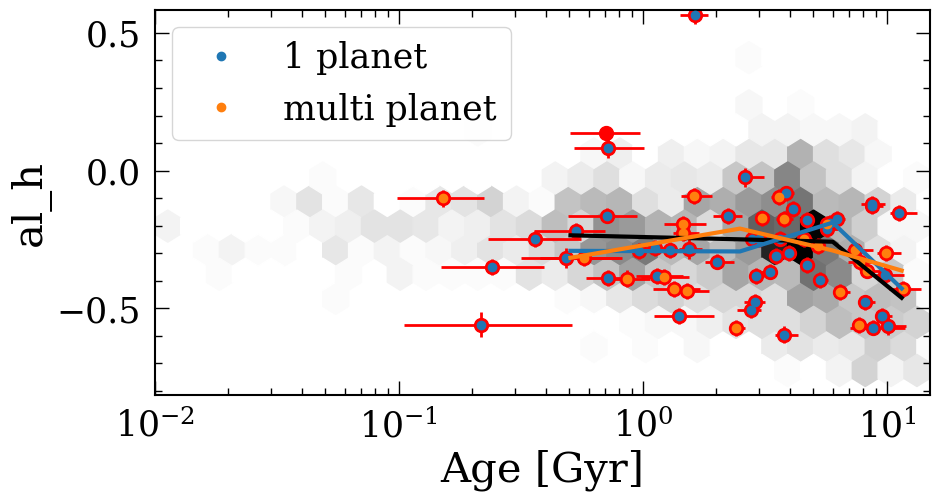

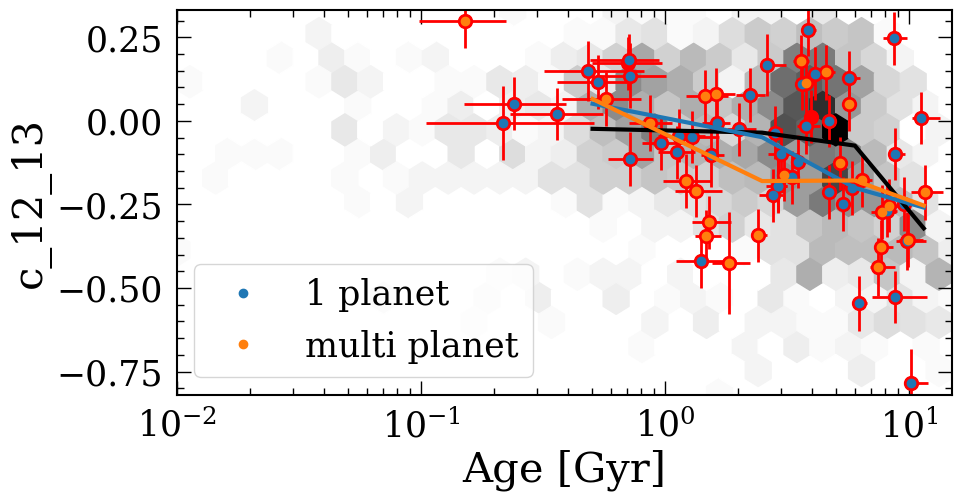

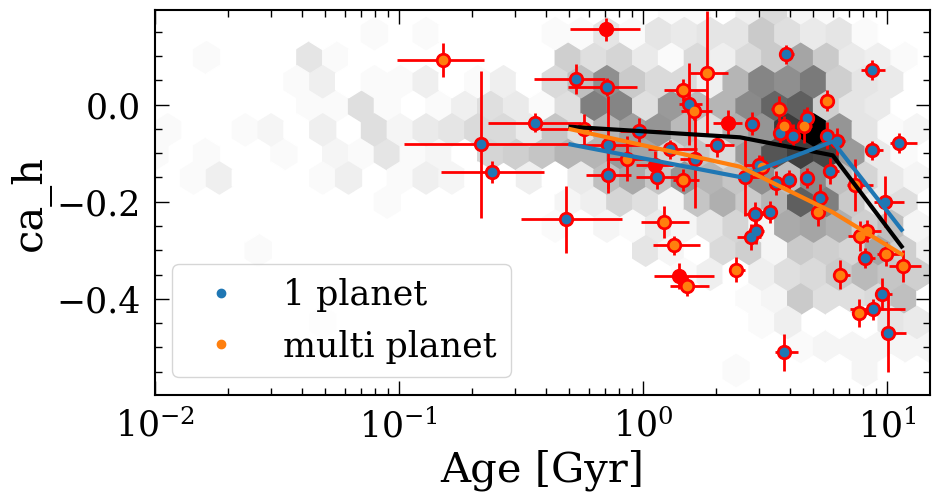

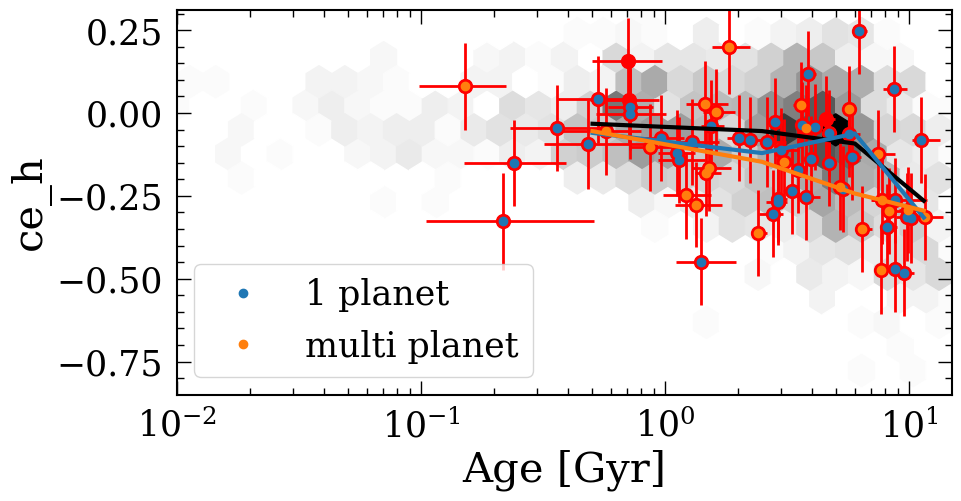

...

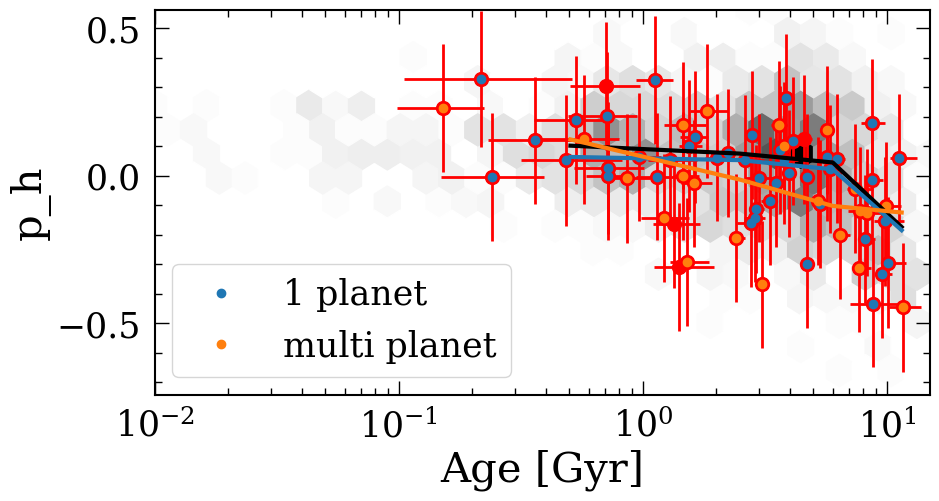

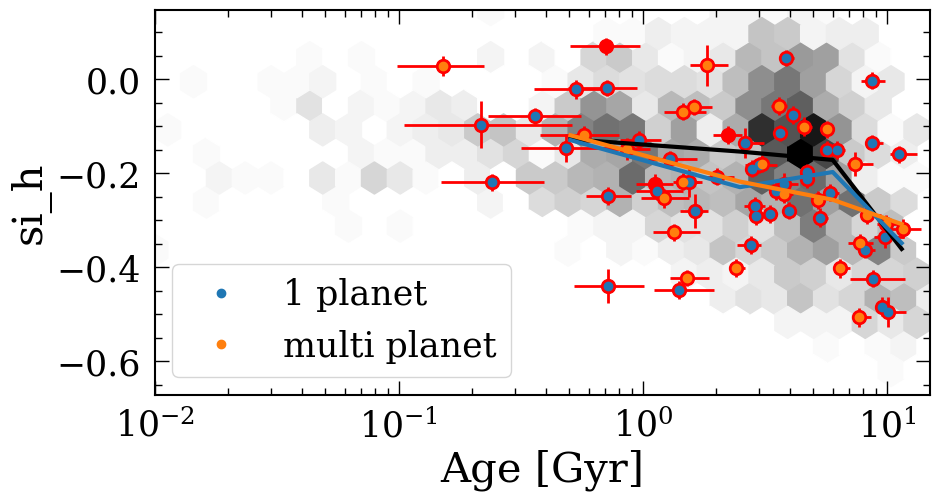

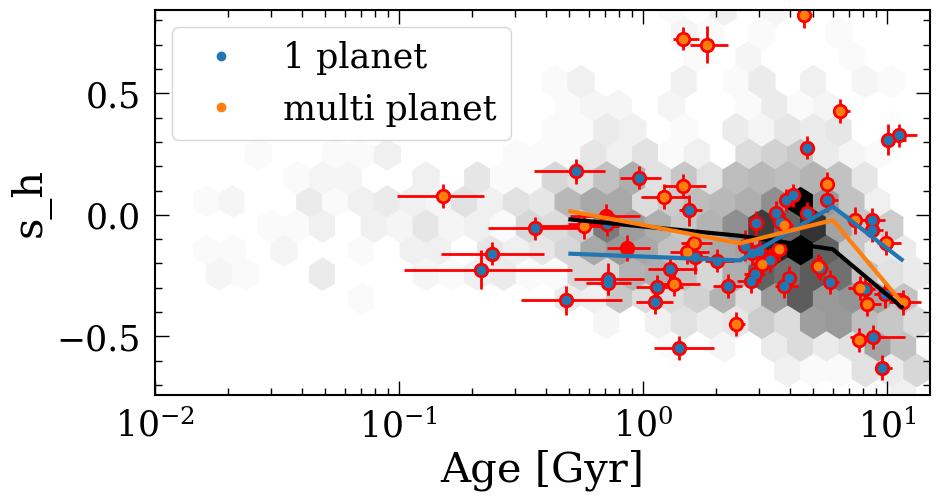

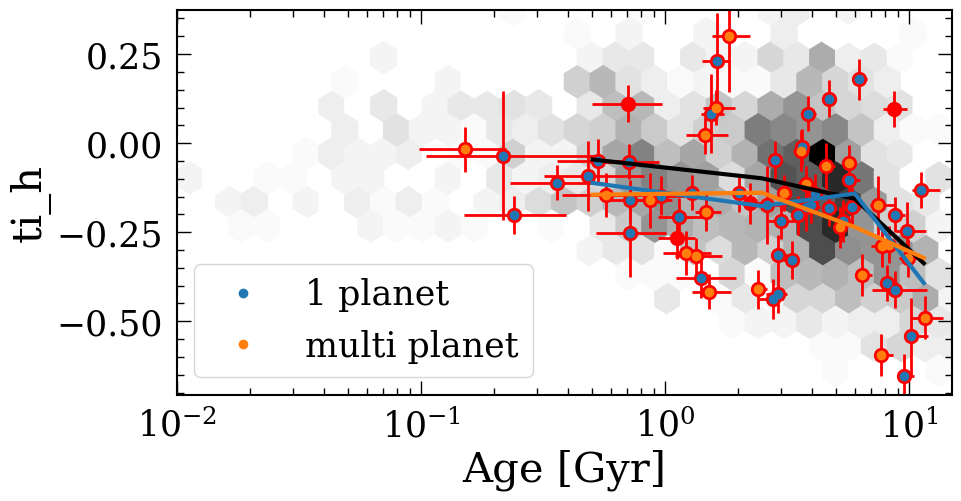

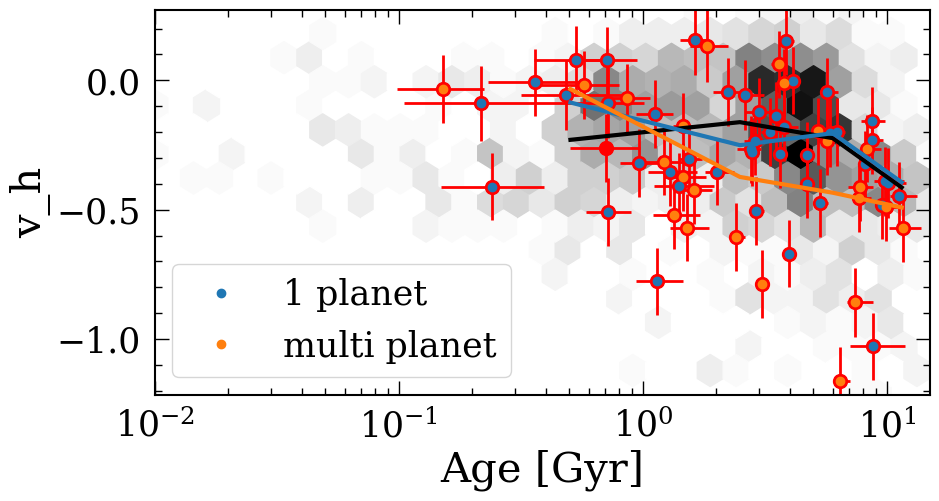

In [125]:
#agesbins = np.linspace(np.log10(0.01), np.log10(15), 10)
agesbins = np.array([0.01, 1, 4, 8, 15])
elediffs = np.ones((len(abund_cols), len(agesbins)-1))*np.nan
elediffs_s = np.ones((len(abund_cols), len(agesbins)-1))*np.nan
elediffs_m = np.ones((len(abund_cols), len(agesbins)-1))*np.nan
avediff = np.ones((len(abund_cols)))*np.nan
avediff_s = np.ones((len(abund_cols)))*np.nan
avediff_m = np.ones((len(abund_cols)))*np.nan

averrs = np.ones((len(abund_cols)))*np.nan
for i in range(len(abund_cols)):
    plt.figure(figsize=(10,5))
    if len(ipl3_gyroage[abund_cols[i]].dropna())==0:
        continue
    
    
    m_p = ((ipl3_planet[abund_cols[i]]>-5)&(ipl3_planet[abund_cols_err[i]]<0.5))
    plt.errorbar(ipl3_planet['age_fit_ind'][m_p], ipl3_planet[abund_cols[i]][m_p], 
                yerr=ipl3_planet[abund_cols_err[i]][m_p], fmt='ro', zorder=2,
                ms=10)
    plt.hlines(ipl3_planet[abund_cols[i]][m_p],
               (ipl3_planet['age_fit_ind']+ipl3_planet['age_fit_ind_m'])[m_p], 
               (ipl3_planet['age_fit_ind']+ipl3_planet['age_fit_ind_p'])[m_p],
              color='r', zorder=2)
    
    m = ((ipl3_gyroage[abund_cols[i]]>-5)&(ipl3_gyroage[abund_cols_err[i]]<0.5))
    ymin = min([np.percentile(ipl3_gyroage[abund_cols[i]][m].dropna(), 1),
               np.percentile(ipl3_planet[abund_cols[i]][m_p].dropna(), 1)])
    ymax = max([np.percentile(ipl3_gyroage[abund_cols[i]][m].dropna(), 99),
               np.percentile(ipl3_planet[abund_cols[i]][m_p].dropna(), 99)])
    
    m = m&((ipl3_gyroage[abund_cols[i]]>ymin)&(ipl3_gyroage[abund_cols[i]]<ymax))
    m_p = m_p&((ipl3_planet[abund_cols[i]]>ymin)&(ipl3_planet[abund_cols[i]]<ymax))
    
    averrs[i] = np.median(ipl3_gyroage[abund_cols_err[i]].dropna())
    
    if abund_cols[i]=='n_m_atm':
        plt.ylim([-1, 1])
        plt.hexbin(ipl3_gyroage['age_fit_ind'][m], ipl3_gyroage[abund_cols[i]][m], 
               xscale='log', extent=(-2, np.log10(15), -1, 1), zorder=1, gridsize=(30, 8),
                  mincnt=1, cmap='binary')
        """plt.plot(ipl3_gyroage['age_fit_ind'][m], ipl3_gyroage[abund_cols[i]][m], 
                'o', color='grey', zorder=1, ms=5)"""
        
    else:
        plt.hexbin(ipl3_gyroage['age_fit_ind'][m], ipl3_gyroage[abund_cols[i]][m], 
                   xscale='log', extent=(-2, np.log10(15), ymin, ymax), zorder=1, gridsize=(30, 8),
                  mincnt=1, cmap='binary')
        """plt.plot(ipl3_gyroage['age_fit_ind'][m], ipl3_gyroage[abund_cols[i]][m], 
                'o', color='grey', zorder=1, ms=5)"""
        plt.ylim([ymin, ymax])
    
    
        
    m2 = (m_p&(ipl3_planet['sy_pnum'][m]==1))
    plt.plot(ipl3_planet['age_fit_ind'][m2], ipl3_planet[abund_cols[i]][m2], 'o',
               c='C0', zorder=3, label='1 planet')
    
    m3 = (m_p&(ipl3_planet['sy_pnum'][m]>1))
    plt.plot(ipl3_planet['age_fit_ind'][m3], ipl3_planet[abund_cols[i]][m3], 'o',
               c='C1', zorder=3, label='multi planet')
    
    ave_y_all = np.ones(len(agesbins)-1)*np.nan
    ave_y_pl = np.ones(len(agesbins)-1)*np.nan
    ave_y_pl_multi = np.ones(len(agesbins)-1)*np.nan
    ave_y_pl_all = np.ones(len(agesbins)-1)*np.nan
    for j in range(len(agesbins)-1):
        ipl3_gyroage_sing = ipl3_gyroage.loc[((ipl3_gyroage['age_fit_ind'])>agesbins[j])&((ipl3_gyroage['age_fit_ind'])<agesbins[j+1])]
        ipl3_planet_sing_all = ipl3_planet[m_p].loc[((ipl3_planet['age_fit_ind'][m_p])>agesbins[j])&((ipl3_planet['age_fit_ind'][m_p])<agesbins[j+1])]
        ipl3_planet_sing = ipl3_planet[m2].loc[((ipl3_planet['age_fit_ind'][m2])>agesbins[j])&((ipl3_planet['age_fit_ind'][m2])<agesbins[j+1])]
        ipl3_planet_multi = ipl3_planet[m3].loc[((ipl3_planet['age_fit_ind'][m3])>agesbins[j])&((ipl3_planet['age_fit_ind'][m3])<agesbins[j+1])]
       
        if len(ipl3_gyroage_sing)>1:
            ave_y_all[j] = np.median(ipl3_gyroage_sing[abund_cols[i]].dropna())
            
        if len(ipl3_planet_sing)>1:
            ave_y_pl[j] = np.median(ipl3_planet_sing[abund_cols[i]].dropna())
            ipl3_gyroage_sing_plts = ipl3_gyroage_sing.loc[abs(ipl3_gyroage_sing['fe_h']-np.median(ipl3_planet_sing['fe_h'].dropna()))<0.05]
            ave_y_all_s = np.median(ipl3_gyroage_sing_plts[abund_cols[i]].dropna())
            elediffs_s[i, j] = ave_y_pl[j]-ave_y_all_s
        if len(ipl3_planet_multi)>1:
            ave_y_pl_multi[j] = np.median(ipl3_planet_multi[abund_cols[i]].dropna())
            ipl3_gyroage_sing_plts = ipl3_gyroage_sing.loc[abs(ipl3_gyroage_sing['fe_h']-np.median(ipl3_planet_multi['fe_h'].dropna()))<0.05]
            ave_y_all_s = np.median(ipl3_gyroage_sing_plts[abund_cols[i]].dropna())
            elediffs_m[i, j] = ave_y_pl_multi[j]-ave_y_all_s
        if len(ipl3_planet_sing_all)>1:
            ave_y_pl_all[j] = np.median(ipl3_planet_sing_all[abund_cols[i]].dropna())
            ipl3_gyroage_sing_plts = ipl3_gyroage_sing.loc[abs(ipl3_gyroage_sing['fe_h']-np.median(ipl3_planet_sing_all['fe_h'].dropna()))<0.05]
            ave_y_all_s = np.median(ipl3_gyroage_sing_plts[abund_cols[i]].dropna())
            elediffs[i, j] = ave_y_pl_all[j]-ave_y_all_s
            
        #elediffs[i, :] = ave_y_pl_all-ave_y_all
        #elediffs_s[i, :] = ave_y_pl-ave_y_all
        #elediffs_m[i, :] = ave_y_pl_multi-ave_y_pl
    
    ipl3_gyroage_full = ipl3_gyroage.loc[abs(ipl3_gyroage['fe_h']-np.median(ipl3_planet['fe_h'].dropna()))<0.05]
    avediff[i] = np.median(ipl3_gyroage_full[abund_cols[i]][m].dropna())-np.median(ipl3_planet[abund_cols[i]][m_p].dropna())
    
    ipl3_gyroage_full = ipl3_gyroage.loc[abs(ipl3_gyroage['fe_h']-np.median(ipl3_planet[m2]['fe_h'].dropna()))<0.05]
    avediff_s[i] = np.median(ipl3_gyroage_full[abund_cols[i]][m].dropna())-np.median(ipl3_planet[abund_cols[i]][m2].dropna())
    
    ipl3_gyroage_full = ipl3_gyroage.loc[abs(ipl3_gyroage['fe_h']-np.median(ipl3_planet[m3]['fe_h'].dropna()))<0.05]
    avediff_m[i] = np.median(ipl3_gyroage_full[abund_cols[i]][m].dropna())-np.median(ipl3_planet[abund_cols[i]][m3].dropna())
    
    plt.plot(agesbins[1:]/2+agesbins[:-1]/2, ave_y_all, 'k-', zorder=4, linewidth=3)
    plt.plot(agesbins[1:]/2+agesbins[:-1]/2, ave_y_pl, '-', color='C0', zorder=4, linewidth=3)
    plt.plot(agesbins[1:]/2+agesbins[:-1]/2, ave_y_pl_multi, '-', color='C1', zorder=4, linewidth=3)

    plt.legend(frameon=True)
    plt.xlabel('Age [Gyr]')
    plt.ylabel(abund_cols[i])
    plt.xlim([0.01,15])
    plt.xscale('log')
    

In [126]:
cond['elm_mwm'] = ['na_h','mg_h','al_h','si_h','s_h','ca_h',
                  np.nan, 'ti_h', np.nan, 'v_h', 'cr_h',
                  np.nan, 'fe_h', np.nan, 'co_h', 'ni_h', np.nan,
                  np.nan, np.nan, np.nan, 'ce_h', 'c_h', 'o_h']

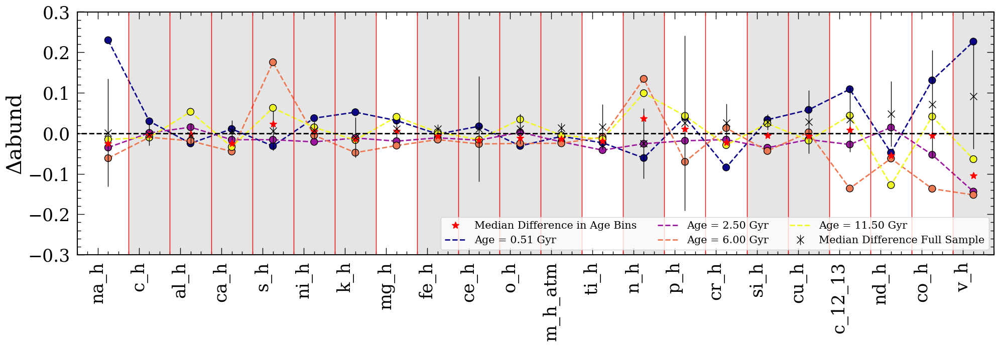

In [142]:
plt.figure(figsize=(20,7))
ages_mid = agesbins[1:]/2+agesbins[:-1]/2
agecmaps = getcolor(range(len(ages_mid)))

avediff_sort, orders = zip(*sorted(zip(abs(avediff), np.linspace(0, len(avediff)-1, len(avediff)))))
#atomic_numbers_order, orders = zip(*sorted(zip(abs(atomic_numbers), np.linspace(0, len(avediff)-1, len(avediff)))))

orders = [int(i) for i in orders]
for i in range(len(abund_cols)):
    i_ord = (orders[i])
    if i==0:
        plt.scatter(np.ones(len(ages_mid))*(i*2+1.5), elediffs[i_ord, :], c = agecmaps,
               s=100, edgecolor='k',  zorder=2)
        plt.errorbar(1*(i*2+1.5), avediff[i_ord], fmt = 'kx', linewidth=1,
                     yerr = averrs[i_ord], label='Median Difference Full Sample', zorder=2, ms=10)
        plt.plot(1*(i*2+1.5), np.median(elediffs[i_ord, :][elediffs[i_ord, :]==elediffs[i_ord, :]]), 'r*', label='Median Difference in Age Bins', zorder=2, ms=10)
        
    else:
        plt.scatter(np.ones(len(ages_mid))*(i*2+1.5), elediffs[i_ord, :], c = agecmaps,
               s=100, edgecolor='k', zorder=2, )
        plt.errorbar(1*(i*2+1.5), avediff[i_ord], linewidth=1,
                     fmt = 'kx', zorder=2, ms=10, yerr = averrs[i_ord])
        plt.plot(1*(i*2+1.5), np.median(elediffs[i_ord, :][elediffs[i_ord, :]==elediffs[i_ord, :]]), 'r*', zorder=2, ms=10)
        
    if abund_cols[i_ord] in cond['elm_mwm'].values:
        #print(abund_cols[i])
        plt.fill_betweenx([-0.4, 0.4], (i*2+1)+1.5, ((i+1)*2+1)+1.5,
                          color='grey', alpha=0.2)

    
plt.vlines([(i*2+1)+1.5 for i in range(len(abund_cols))], -0.4, 0.4,
          color='r', linewidth=1)
plt.hlines(0, -0.5, (i*2+1)+2, linestyle='--', color='k')
plt.xticks([(i*2+1) for i in range(len(abund_cols))],
          [abund_cols[i] for i in orders], rotation=90);
#plt.colorbar(label='Age [Gyr]')
plt.ylabel('Δabund')
plt.ylim([-0.3, 0.3])
plt.xlim([-0, (i*2+1)+1.5])

for i in range(len(ages_mid)):
    pltys = []
    for k in range(len(elediffs[:, i])):
        k_ord = (orders[k])
        if elediffs[k_ord, i]==elediffs[k_ord, i]:
            pltys.append(elediffs[k_ord, i])
    plt.plot(np.array([1*(j*2+1.5) for j in range(len(abund_cols))])[elediffs[:, i]==elediffs[:, i]], 
             pltys, '--', color=agecmaps[i], zorder=1, linewidth=2, label='Age = %.2f Gyr'%(ages_mid[i]))
plt.legend(frameon=True, fontsize=15, ncols=3)
plt.tight_layout()

plt.savefig('./Figures/Summary_abund_all.png', bbox_inches='tight')

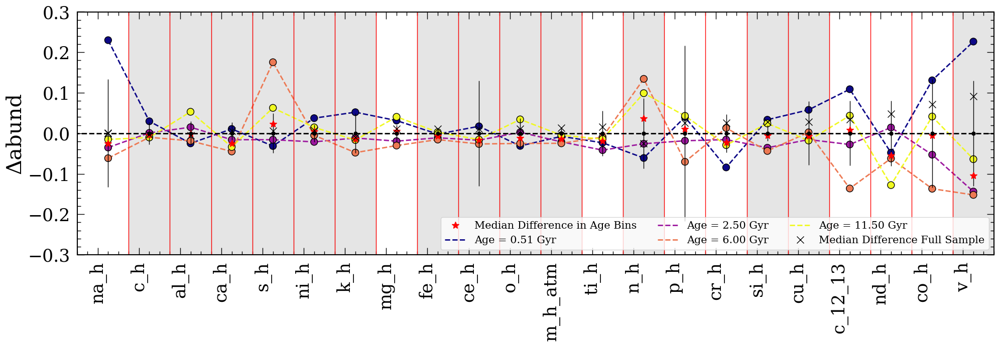

In [149]:
plt.figure(figsize=(20,7))
ages_mid = agesbins[1:]/2+agesbins[:-1]/2
agecmaps = getcolor(range(len(ages_mid)))

avediff_sort, orders = zip(*sorted(zip(abs(avediff), np.linspace(0, len(avediff)-1, len(avediff)))))
#atomic_numbers_order, orders = zip(*sorted(zip(abs(atomic_numbers), np.linspace(0, len(avediff)-1, len(avediff)))))

orders = [int(i) for i in orders]
for i in range(len(abund_cols)):
    i_ord = (orders[i])
    if i==0:
        plt.scatter(np.ones(len(ages_mid))*(i*2+1.5),
                    elediffs[i_ord, :], c = agecmaps,
               s=100, edgecolor='k',  zorder=2)
        plt.errorbar(1*(i*2+1.5), avediff[i_ord], fmt = 'kx', linewidth=1,
                     label='Median Difference Full Sample', zorder=2, ms=10)
        
        plt.errorbar(1*(i*2+1.5), 0, fmt = 'kx', linewidth=1,
                     yerr = averrs[i_ord], zorder=2, ms=10)
        
        plt.plot(1*(i*2+1.5), np.median(elediffs[i_ord, :][elediffs[i_ord, :]==elediffs[i_ord, :]]), 'r*', label='Median Difference in Age Bins', zorder=2, ms=10)
        
    else:
        plt.scatter(np.ones(len(ages_mid))*(i*2+1.5), elediffs[i_ord, :], c = agecmaps,
               s=100, edgecolor='k', zorder=2, )
        plt.errorbar(1*(i*2+1.5), avediff[i_ord], linewidth=1,
                     fmt = 'kx', zorder=2, ms=10)
        plt.errorbar(1*(i*2+1.5), 0, fmt = 'k.', linewidth=1,
                     yerr = averrs[i_ord], zorder=2, ms=10)
        
        plt.plot(1*(i*2+1.5), np.median(elediffs[i_ord, :][elediffs[i_ord, :]==elediffs[i_ord, :]]), 'r*', zorder=2, ms=10)
        
    if abund_cols[i_ord] in cond['elm_mwm'].values:
        #print(abund_cols[i])
        plt.fill_betweenx([-0.4, 0.4], (i*2+1)+1.5, ((i+1)*2+1)+1.5,
                          color='grey', alpha=0.2)

    
plt.vlines([(i*2+1)+1.5 for i in range(len(abund_cols))], -0.4, 0.4,
          color='r', linewidth=1)
plt.hlines(0, -0.5, (i*2+1)+2, linestyle='--', color='k')
plt.xticks([(i*2+1) for i in range(len(abund_cols))],
          [abund_cols[i] for i in orders], rotation=90);
#plt.colorbar(label='Age [Gyr]')
plt.ylabel('Δabund')
plt.ylim([-0.3, 0.3])
plt.xlim([-0, (i*2+1)+1.5])

for i in range(len(ages_mid)):
    pltys = []
    for k in range(len(elediffs[:, i])):
        k_ord = (orders[k])
        if elediffs[k_ord, i]==elediffs[k_ord, i]:
            pltys.append(elediffs[k_ord, i])
    plt.plot(np.array([1*(j*2+1.5) for j in range(len(abund_cols))])[elediffs[:, i]==elediffs[:, i]], 
             pltys, '--', color=agecmaps[i], zorder=1, linewidth=2, label='Age = %.2f Gyr'%(ages_mid[i]))
plt.legend(frameon=True, fontsize=15, ncols=3)
plt.tight_layout()

plt.savefig('./Figures/Summary_abund_all_err.png', bbox_inches='tight')

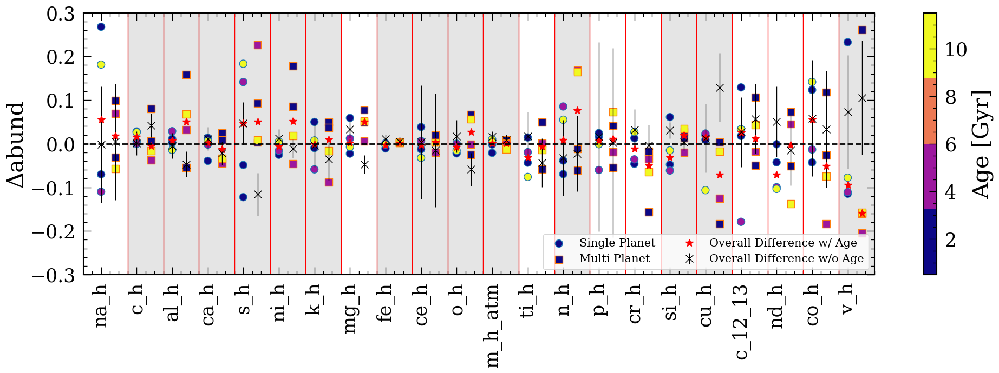

In [143]:
plt.figure(figsize=(20,7))
ages_mid = agesbins[1:]/2+agesbins[:-1]/2
agecmaps = getcolor(range(len(ages_mid)+1))

avediff_sort, orders = zip(*sorted(zip(abs(avediff), np.linspace(0, len(avediff)-1, len(avediff)))))
#atomic_numbers_order, orders = zip(*sorted(zip(abs(atomic_numbers), np.linspace(0, len(avediff)-1, len(avediff)))))

orders = [int(i) for i in orders]

for i in range(len(abund_cols)):
    i_ord = (orders[i])
    if i==0:
        plt.scatter(np.ones(len(ages_mid))*(i*2+1), elediffs_s[i_ord, :], c = ages_mid,
               s=100, edgecolor='C0',vmin=min(ages_mid),vmax=max(ages_mid),
                    label='Single Planet', zorder=2, cmap=plt.get_cmap('plasma',len(ages_mid)))
        plt.scatter(np.ones(len(ages_mid))*(i*2+1)+0.8, elediffs_m[i_ord, :], c = ages_mid,
               s=100, edgecolor='C1', marker='s', vmin=min(ages_mid),vmax=max(ages_mid),
                    label='Multi Planet', zorder=2, cmap=plt.get_cmap('plasma',len(ages_mid)))
        plt.errorbar(1*(i*2+1), avediff_s[i_ord], yerr=averrs[i_ord], linewidth=1,
                     fmt='kx', label='Overall Difference w/o Age', zorder=2, ms=10)
        plt.errorbar(1*(i*2+1)+0.8, avediff_m[i_ord], yerr=averrs[i_ord],
                     fmt='kx', zorder=2, ms=10, linewidth=1)
        
        plt.plot(1*(i*2+1), np.median(elediffs_s[i_ord, :][elediffs_s[i_ord, :]==elediffs_s[i_ord, :]]), 'r*', label='Overall Difference w/ Age', zorder=2, ms=10)
        plt.plot(1*(i*2+1)+0.8, np.median(elediffs_m[i_ord, :][elediffs_m[i_ord, :]==elediffs_m[i_ord, :]]), 'r*', zorder=2, ms=10)
        
    else:
        plt.scatter(np.ones(len(ages_mid))*(i*2+1), elediffs_s[i_ord, :], c = ages_mid,
               s=100, edgecolor='C0', vmin=min(ages_mid),vmax=max(ages_mid), zorder=2, cmap=plt.get_cmap('plasma',len(ages_mid)))
        plt.scatter(np.ones(len(ages_mid))*(i*2+1)+0.8, elediffs_m[i_ord, :], c = ages_mid,
               s=100, edgecolor='C1', marker='s', vmin=min(ages_mid),vmax=max(ages_mid), zorder=2, cmap=plt.get_cmap('plasma',len(ages_mid)))
        
        plt.errorbar(1*(i*2+1), avediff_s[i_ord], yerr=averrs[i_ord],
                     fmt='kx', zorder=2, ms=10, linewidth=1)
        plt.errorbar(1*(i*2+1)+0.8, avediff_m[i_ord], yerr=averrs[i_ord],
                     fmt='kx', zorder=2, ms=10, linewidth=1)
        
        plt.plot(1*(i*2+1), np.median(elediffs_s[i_ord, :][elediffs_s[i_ord, :]==elediffs_s[i_ord, :]]), 'r*', zorder=2, ms=10)
        plt.plot(1*(i*2+1)+0.8, np.median(elediffs_m[i_ord, :][elediffs_m[i_ord, :]==elediffs_m[i_ord, :]]), 'r*', zorder=2, ms=10)
        
    if abund_cols[i_ord] in cond['elm_mwm'].values:
        #print(abund_cols[i])
        plt.fill_betweenx([-0.4, 0.4], (i*2+1)+1.5, ((i+1)*2+1)+1.5,
                          color='grey', alpha=0.2)
    
plt.vlines([(i*2+1)+1.5 for i in range(len(abund_cols))], -0.4, 0.4,
          color='r', linewidth=1)
plt.hlines(0, -0.5, (i*2+1)+2, linestyle='--', color='k')
plt.xticks([(i*2+1) for i in range(len(abund_cols))],
          [abund_cols[i] for i in orders], rotation=90);
plt.colorbar(label='Age [Gyr]')
plt.ylabel('Δabund')
plt.ylim([-0.3, 0.3])
plt.xlim([-0, (i*2+1)+1.5])
plt.legend(frameon=True, fontsize=15, ncols=2)

"""for i in range(len(ages_mid)):
    plt.plot([1*(j*2+1) for j in range(len(abund_cols))], elediffs_s[:, i],
            color=agecmaps[i], zorder=1, linewidth=1)"""
    
plt.tight_layout()

plt.savefig('./Figures/Summary_abund.png', bbox_inches='tight')

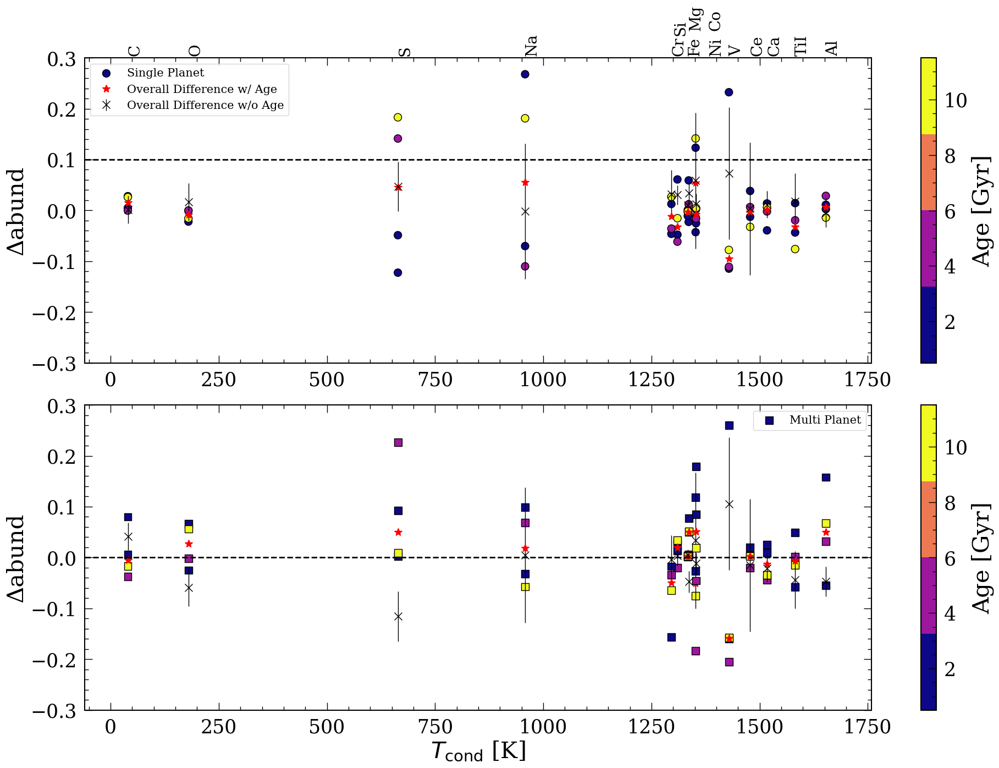

In [121]:
plt.figure(figsize=(20,14))
ages_mid = agesbins[1:]/2+agesbins[:-1]/2
agecmaps = getcolor(range(len(ages_mid)+1))
abund_cond = cond['elm_mwm'].values
tcond = cond['Tcond'].values
y_1 = []
y_2 = []
y_3 = []
y_4 = []
ts = []


plt.subplot(2,1,1)
for i in range(len(abund_cond)):
    if abund_cond[i]!=abund_cond[i]:
        continue
    t_cond_sing = tcond[i]
    index_sing = np.where(np.array(abund_cols)==abund_cond[i])[0][0]
    if i==0:
        plt.scatter(np.ones(len(ages_mid))*tcond[i], elediffs_s[index_sing, :], c = ages_mid,
               s=100, edgecolor='k',vmin=min(ages_mid),vmax=max(ages_mid),
                    label='Single Planet', zorder=2, cmap=plt.get_cmap('plasma',len(ages_mid)))
        plt.errorbar(tcond[i], avediff_s[index_sing], yerr=averrs[index_sing],
                     fmt='kx', label='Overall Difference w/o Age', zorder=2, ms=10, linewidth=1)
        
        plt.plot(tcond[i], np.median(elediffs_s[index_sing, :][elediffs_s[index_sing, :]==elediffs_s[index_sing, :]]), 'r*', label='Overall Difference w/ Age', zorder=2, ms=10)
        
    else:
        plt.scatter(np.ones(len(ages_mid))*tcond[i], elediffs_s[index_sing, :], c = ages_mid,
               s=100, edgecolor='k', vmin=min(ages_mid),vmax=max(ages_mid), zorder=2, cmap=plt.get_cmap('plasma',len(ages_mid)))
        plt.errorbar(tcond[i], avediff_s[index_sing], yerr=averrs[index_sing],
                     fmt='kx', zorder=2, ms=10, linewidth=1)
        plt.plot(tcond[i], np.median(elediffs_s[index_sing, :][elediffs_s[index_sing, :]==elediffs_s[index_sing, :]]), 'r*', zorder=2, ms=10)
        
    if ((tcond[i]>1250)&(tcond[i]<1400)):
        if (cond['element'].values[i])=='FeI':
            plt.text(tcond[i], 0.31, 'Fe', 
                 rotation='vertical', fontsize=20)
        elif (cond['element'].values[i])=='Cr':
            plt.text(tcond[i], 0.31, 'Cr', 
                 rotation='vertical', fontsize=20)
        elif (cond['element'].values[i])=='Mg':
            plt.text(tcond[i], 0.36, 'Mg', 
                 rotation='vertical', fontsize=20)
        elif (cond['element'].values[i])=='Co':
            plt.text(tcond[i]+30, 0.36, 'Co', 
                 rotation='vertical', fontsize=20)
        elif (cond['element'].values[i])=='Ni':
            plt.text(tcond[i]+30, 0.31, 'Ni', 
                 rotation='vertical', fontsize=20)
        else:
            plt.text(tcond[i]-10, 0.35, cond['element'].values[i], 
                 rotation='vertical', fontsize=20)
            
        
    else:
        plt.text(tcond[i], 0.31, cond['element'].values[i], 
                 rotation='vertical', fontsize=20)
    y_1.append(elediffs_s[index_sing, 0])
    y_2.append(elediffs_s[index_sing, 1])
    y_3.append(elediffs_s[index_sing, 2])
    y_4.append(elediffs_s[index_sing, 3])
    ts.append(tcond[i])
    
ts, y_1, y_2, y_3, y_4 = zip(*sorted(zip(ts, y_1, y_2, y_3, y_4)))

#plt.plot(ts, y_1, color=agecmaps[0], zorder=1)
#plt.plot(ts, y_2, color=agecmaps[1], zorder=1)
#plt.plot(ts, y_3, color=agecmaps[2], zorder=1)
#plt.plot(ts, y_4, color=agecmaps[3], zorder=1)
    
plt.legend(frameon=True, fontsize=15)
plt.ylim([-0.3, 0.3])
plt.xlim([min(tcond)-100, max(tcond)+100])
plt.hlines(0.1, min(tcond)-100, max(tcond)+100, linestyle='--', color='k')
plt.ylabel('Δabund')
plt.colorbar(label='Age [Gyr]')


y_1 = []
y_2 = []
y_3 = []
y_4 = []
ts = []

plt.subplot(2,1,2)
for i in range(len(abund_cond)):
    if abund_cond[i]!=abund_cond[i]:
        continue
    t_cond_sing = tcond[i]
    index_sing = np.where(np.array(abund_cols)==abund_cond[i])[0][0]
    
    
    if i==0:
        plt.scatter(np.ones(len(ages_mid))*(tcond[i]), elediffs_m[index_sing, :], c = ages_mid,
               s=100, edgecolor='k', marker='s', vmin=min(ages_mid),vmax=max(ages_mid),
                    label='Multi Planet', zorder=2, cmap=plt.get_cmap('plasma',len(ages_mid)))
        plt.errorbar(tcond[i], avediff_m[index_sing], yerr=averrs[index_sing],
                     fmt='kx', zorder=2, ms=10, linewidth=1)
        
        plt.plot(tcond[i], np.median(elediffs_m[index_sing, :][elediffs_m[index_sing, :]==elediffs_m[index_sing, :]]), 'r*', zorder=2, ms=10)
        
    else:
        plt.scatter(np.ones(len(ages_mid))*(tcond[i]), elediffs_m[index_sing, :], c = ages_mid,
               s=100, edgecolor='k', marker='s', vmin=min(ages_mid),vmax=max(ages_mid), zorder=2, cmap=plt.get_cmap('plasma',len(ages_mid)))
        
        plt.errorbar(tcond[i], avediff_m[index_sing], fmt='kx', yerr=averrs[index_sing],
                     zorder=2, ms=10, linewidth=1)
        plt.plot(tcond[i], np.median(elediffs_m[index_sing, :][elediffs_m[index_sing, :]==elediffs_m[index_sing, :]]), 'r*', zorder=2, ms=10)

    y_1.append(elediffs_m[index_sing, 0])
    y_2.append(elediffs_m[index_sing, 1])
    y_3.append(elediffs_m[index_sing, 2])
    y_4.append(elediffs_m[index_sing, 3])
    ts.append(tcond[i])
    
ts, y_1, y_2, y_3, y_4 = zip(*sorted(zip(ts, y_1, y_2, y_3, y_4)))

#plt.plot(ts, y_1, color=agecmaps[0], zorder=1)
#plt.plot(ts, y_2, color=agecmaps[1], zorder=1)
#plt.plot(ts, y_3, color=agecmaps[2], zorder=1)
#plt.plot(ts, y_4, color=agecmaps[3], zorder=1)
    
plt.legend(frameon=True, fontsize=15)
plt.ylim([-0.3, 0.3])
plt.xlim([min(tcond)-100, max(tcond)+100])
plt.hlines(0, min(tcond)-100, max(tcond)+100, linestyle='--', color='k')
plt.xlabel('$T_{\\rm cond}$ [K]')
plt.tight_layout()
plt.ylabel('Δabund')
plt.colorbar(label='Age [Gyr]')
#plt.xscale('log')
plt.savefig('./Figures/Summary_abund_tcond.png', bbox_inches='tight')

/var/folders/w0/h14c78gj4rs91wsbcjh87y2m0000gn/T/ipykernel_12316/2171515287.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))


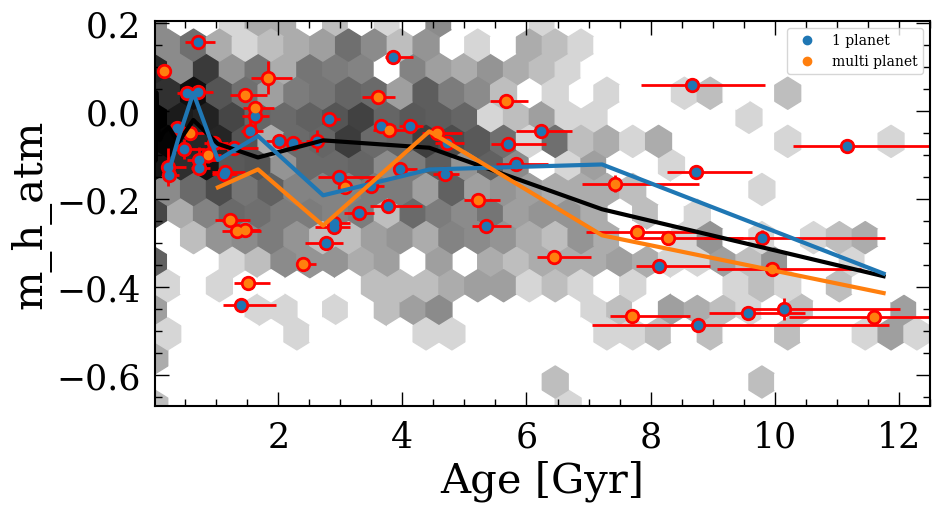

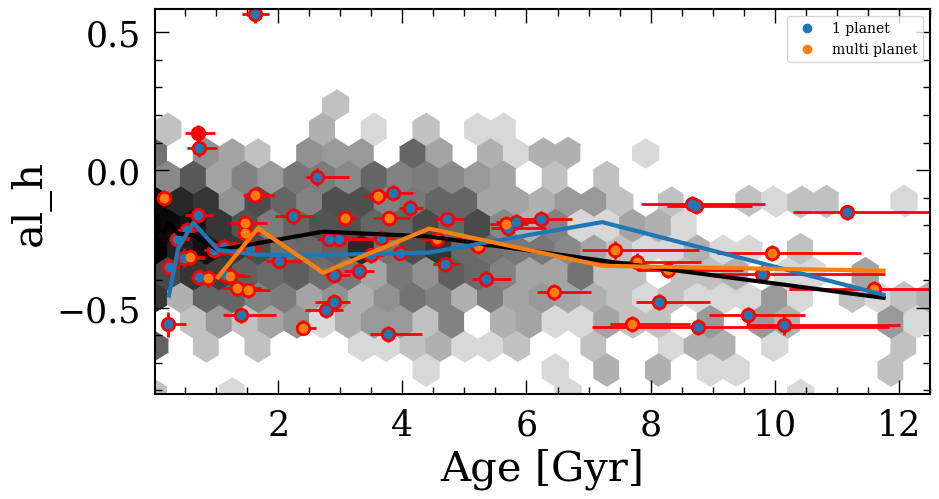

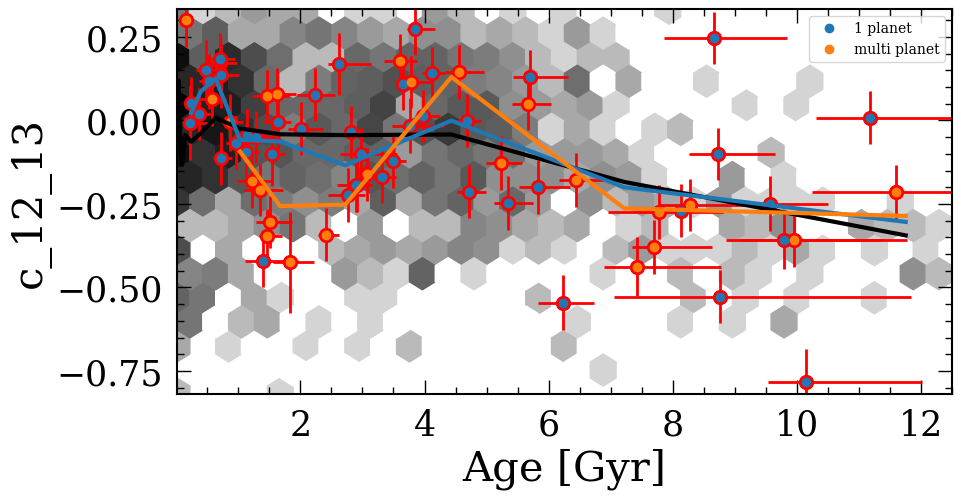

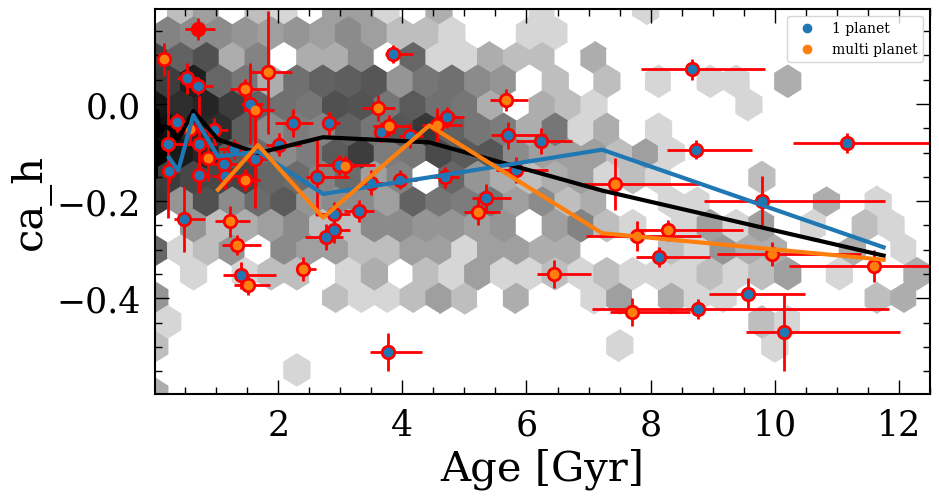

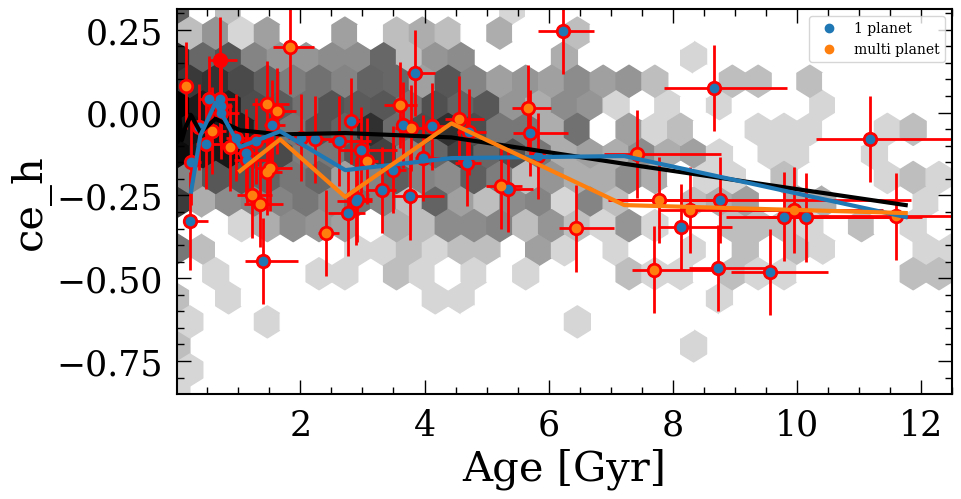

...

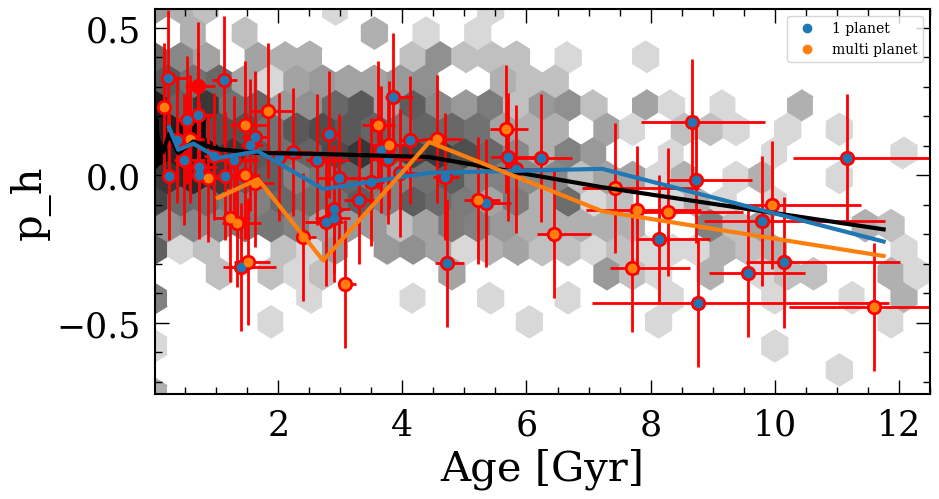

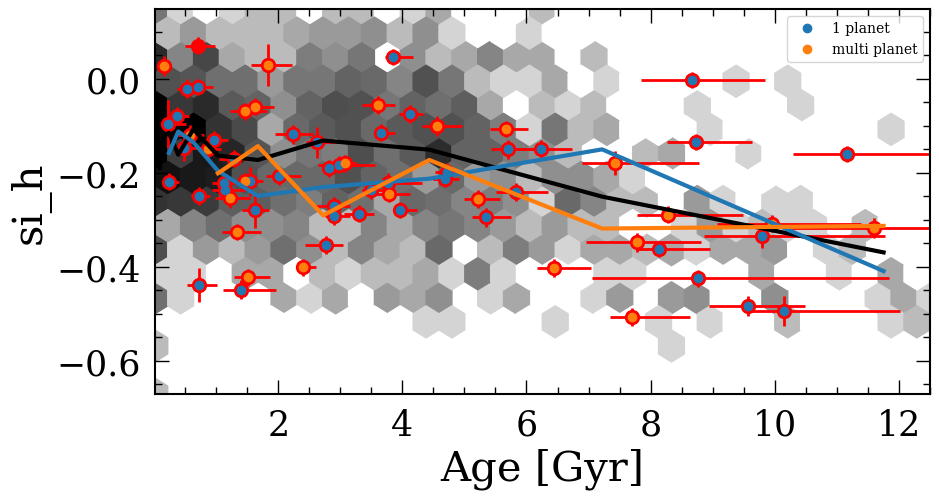

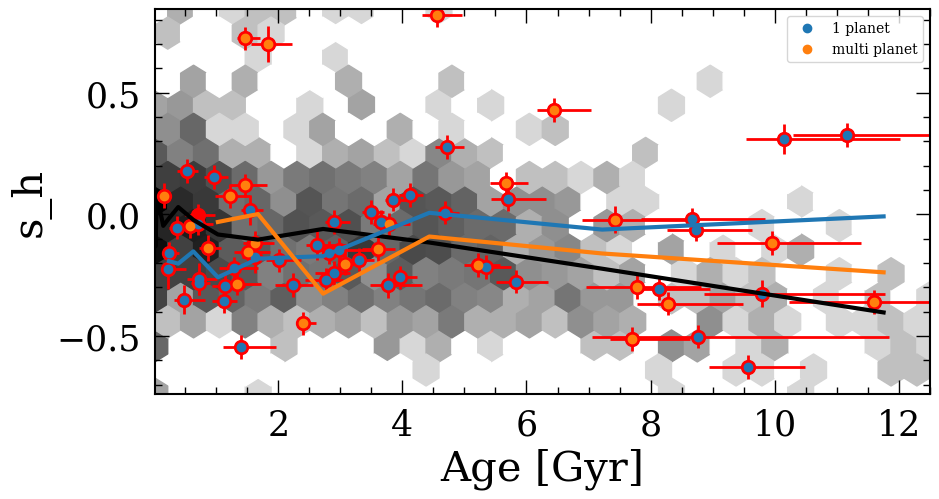

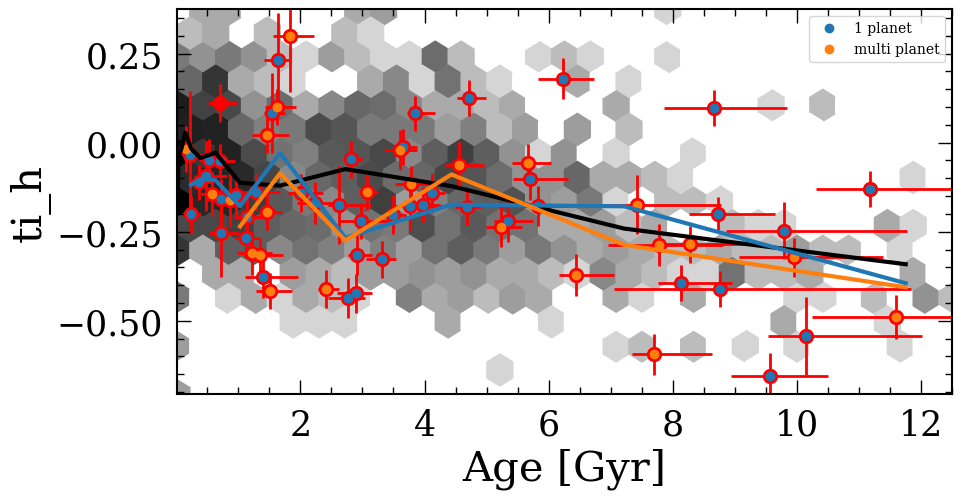

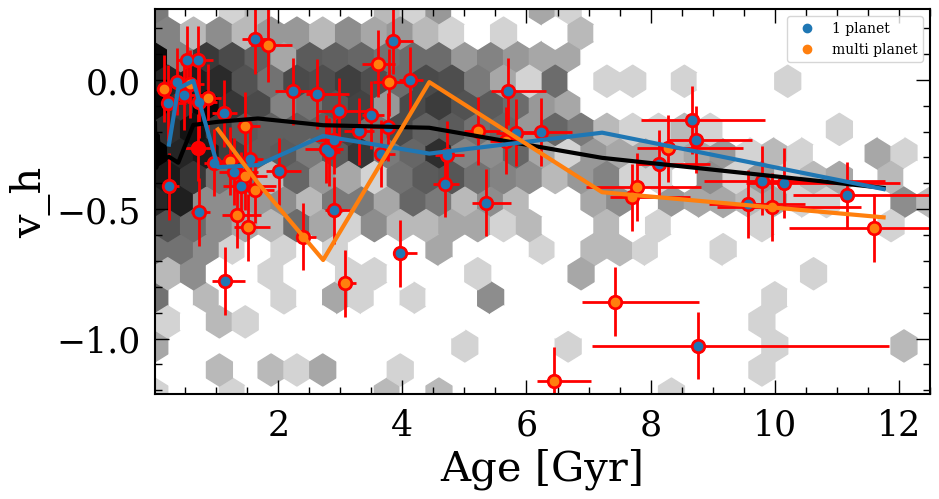

In [122]:
for i in range(len(abund_cols)):
    plt.figure(figsize=(10,5))
    if len(ipl3_gyroage[abund_cols[i]].dropna())==0:
        continue
    
    
    m_p = ((ipl3_planet[abund_cols[i]]>-5)&(ipl3_planet[abund_cols_err[i]]<0.5))
    plt.errorbar(ipl3_planet['age_fit_ind'][m_p], ipl3_planet[abund_cols[i]][m_p], 
                yerr=ipl3_planet[abund_cols_err[i]][m_p], fmt='ro', zorder=2,
                ms=10)
    plt.hlines(ipl3_planet[abund_cols[i]][m_p],
               (ipl3_planet['age_fit_ind']+ipl3_planet['age_fit_ind_m'])[m_p], 
               (ipl3_planet['age_fit_ind']+ipl3_planet['age_fit_ind_p'])[m_p],
              color='r', zorder=2)
    
    m = ((ipl3_gyroage[abund_cols[i]]>-5)&(ipl3_gyroage[abund_cols_err[i]]<0.5))
    ymin = min([np.percentile(ipl3_gyroage[abund_cols[i]][m].dropna(), 1),
               np.percentile(ipl3_planet[abund_cols[i]][m_p].dropna(), 1)])
    ymax = max([np.percentile(ipl3_gyroage[abund_cols[i]][m].dropna(), 99),
               np.percentile(ipl3_planet[abund_cols[i]][m_p].dropna(), 99)])
    
    
    
    if abund_cols[i]=='n_m_atm':
        plt.ylim([-1, 1])
        plt.hexbin(ipl3_gyroage['age_fit_ind'][m], ipl3_gyroage[abund_cols[i]][m], 
               extent=(0.01, 12.5, -1, 1), zorder=1, gridsize=(30, 8),
                  mincnt=1, cmap='binary', bins='log')
        
    else:
        plt.hexbin(ipl3_gyroage['age_fit_ind'][m], ipl3_gyroage[abund_cols[i]][m], 
                   extent=(0.01, 12.5, ymin, ymax), zorder=1, gridsize=(30, 8),
                  mincnt=1, cmap='binary', bins='log')
        plt.ylim([ymin, ymax])
    
    
        
    m2 = (m_p&(ipl3_planet['sy_pnum'][m]==1))
    plt.plot(ipl3_planet['age_fit_ind'][m2], ipl3_planet[abund_cols[i]][m2], 'o',
               c='C0', zorder=3, label='1 planet')
    
    m3 = (m_p&(ipl3_planet['sy_pnum'][m]>1))
    plt.plot(ipl3_planet['age_fit_ind'][m3], ipl3_planet[abund_cols[i]][m3], 'o',
               c='C1', zorder=3, label='multi planet')
    
    agesbins = np.linspace(np.log10(0.01), np.log10(15), 16)
    ave_y_all = np.ones(len(agesbins)-1)*np.nan
    ave_y_pl = np.ones(len(agesbins)-1)*np.nan
    ave_y_pl_multi = np.ones(len(agesbins)-1)*np.nan
    for j in range(len(agesbins)-1):
        ipl3_gyroage_sing = ipl3_gyroage.loc[(np.log10(ipl3_gyroage['age_fit_ind'])>agesbins[j])&(np.log10(ipl3_gyroage['age_fit_ind'])<agesbins[j+1])]
        ipl3_planet_sing = ipl3_planet[m2].loc[(np.log10(ipl3_planet['age_fit_ind'][m2])>agesbins[j])&(np.log10(ipl3_planet['age_fit_ind'][m2])<agesbins[j+1])]
        ipl3_planet_multi = ipl3_planet[m3].loc[(np.log10(ipl3_planet['age_fit_ind'][m3])>agesbins[j])&(np.log10(ipl3_planet['age_fit_ind'][m3])<agesbins[j+1])]
       
        if len(ipl3_gyroage_sing)>1:
            ave_y_all[j] = np.median(ipl3_gyroage_sing[abund_cols[i]].dropna())
        if len(ipl3_planet_sing)>1:
            ave_y_pl[j] = np.median(ipl3_planet_sing[abund_cols[i]].dropna())
        if len(ipl3_planet_multi)>1:
            ave_y_pl_multi[j] = np.median(ipl3_planet_multi[abund_cols[i]].dropna())
            
    
    plt.plot(np.power(10, agesbins[1:]/2+agesbins[:-1]/2), ave_y_all, 'k-', zorder=4, linewidth=3)
    plt.plot(np.power(10, agesbins[1:]/2+agesbins[:-1]/2), ave_y_pl, '-', color='C0', zorder=4, linewidth=3)
    plt.plot(np.power(10, agesbins[1:]/2+agesbins[:-1]/2), ave_y_pl_multi, '-', color='C1', zorder=4, linewidth=3)

    plt.legend(frameon=True, fontsize=10)
    plt.xlabel('Age [Gyr]')
    plt.ylabel(abund_cols[i])
    plt.xlim([0.01, 12.5])
    #plt.xscale('log')
    

In [105]:
#list(ipl3_planet[m].iloc[np.argmin(ipl3_planet[abund_cols[i]][m])])
# outlier -> 2104839471773324032

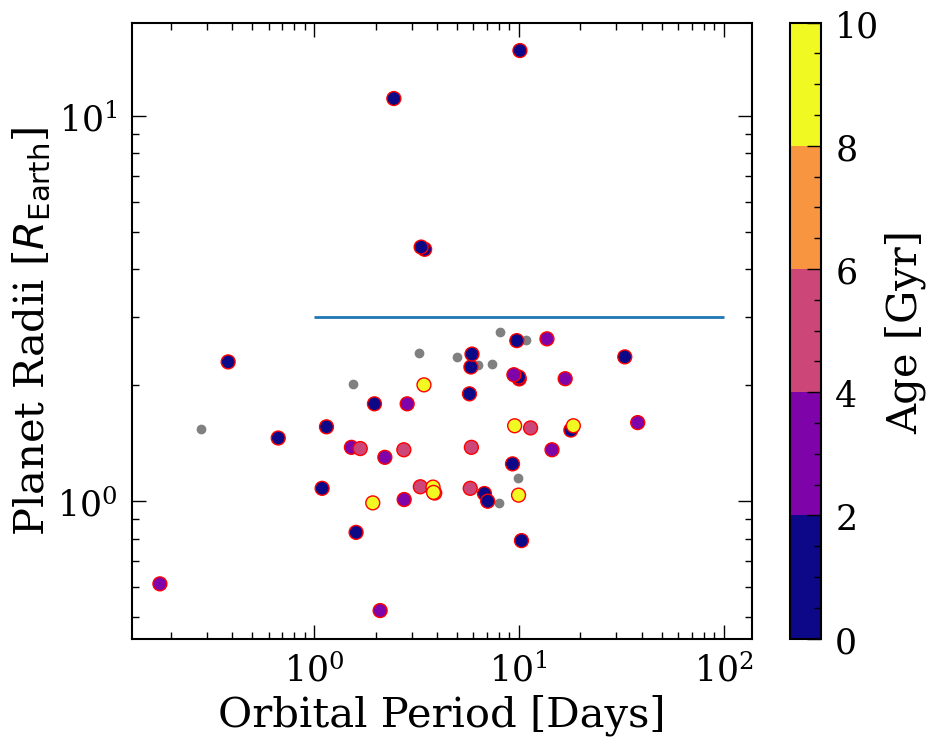

In [106]:
plt.figure(figsize=(10,8))
plt.plot(ipl3_planet['pl_orbper'], ipl3_planet['pl_rade'],
         'o', zorder=1, color='grey')
plt.scatter(ipl3_planet['pl_orbper'], ipl3_planet['pl_rade'], 
           c=(ipl3_planet['age_fit_ind']), vmin=0, vmax=10,
           s=100, edgecolor='r', zorder=2, cmap=plt.get_cmap('plasma', 5))
super_earth = (ipl3_planet['pl_rade']<3)
hot_jupiter = (ipl3_planet['pl_rade']>3)
plt.hlines(3, 1, 100)
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Orbital Period [Days]')
plt.ylabel('Planet Radii [$R_{\\rm Earth}$]')
plt.colorbar(label='Age [Gyr]')

/var/folders/w0/h14c78gj4rs91wsbcjh87y2m0000gn/T/ipykernel_12316/2884514189.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,5))


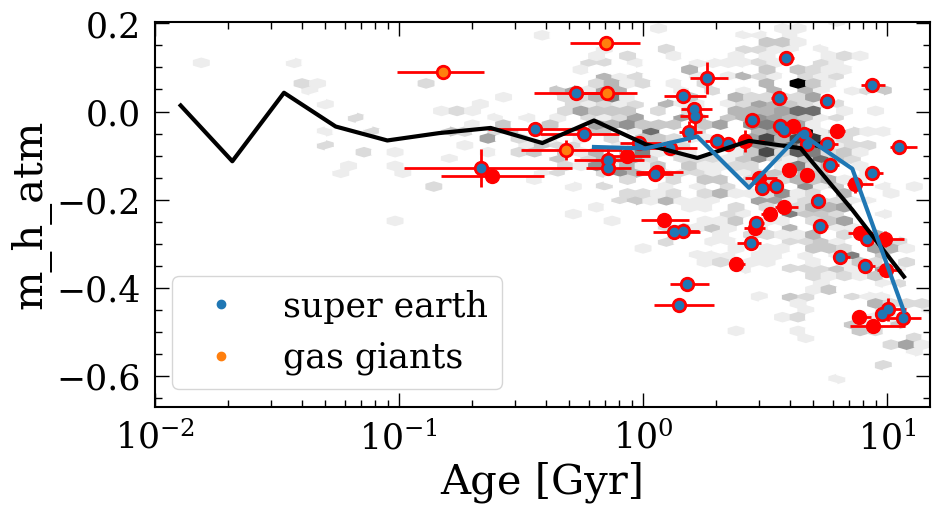

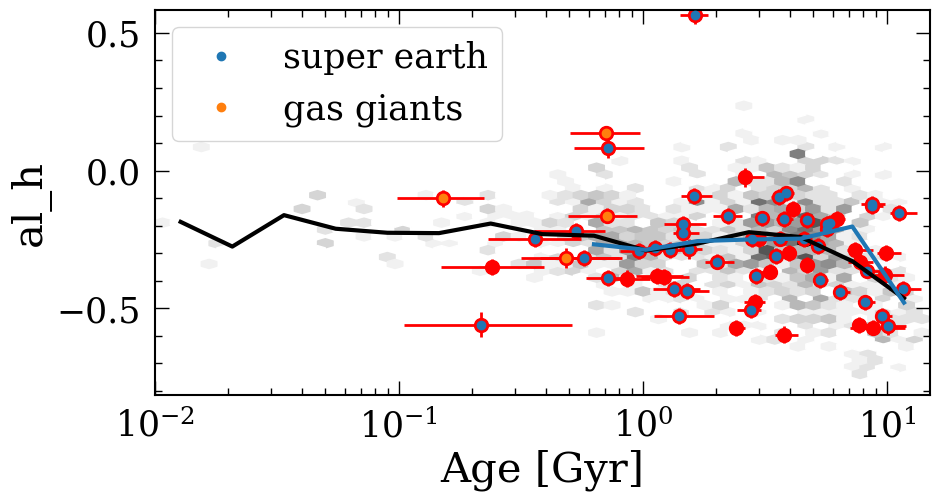

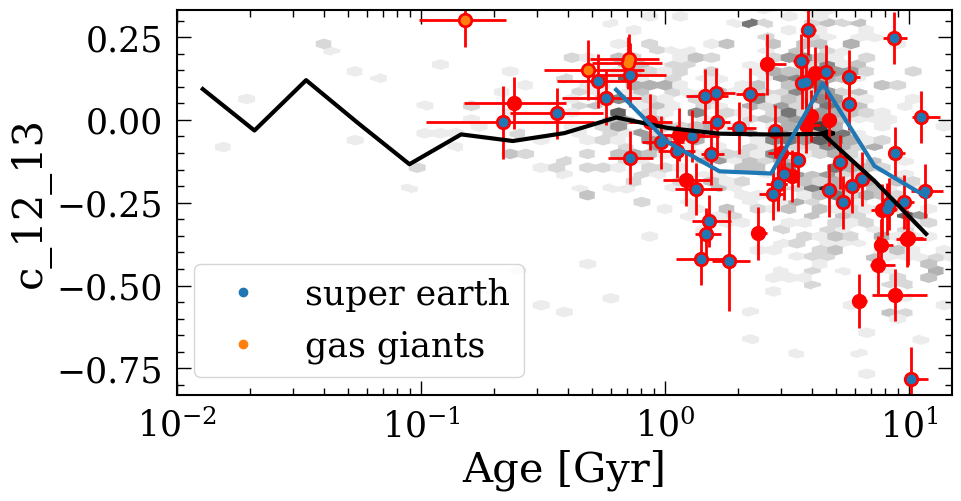

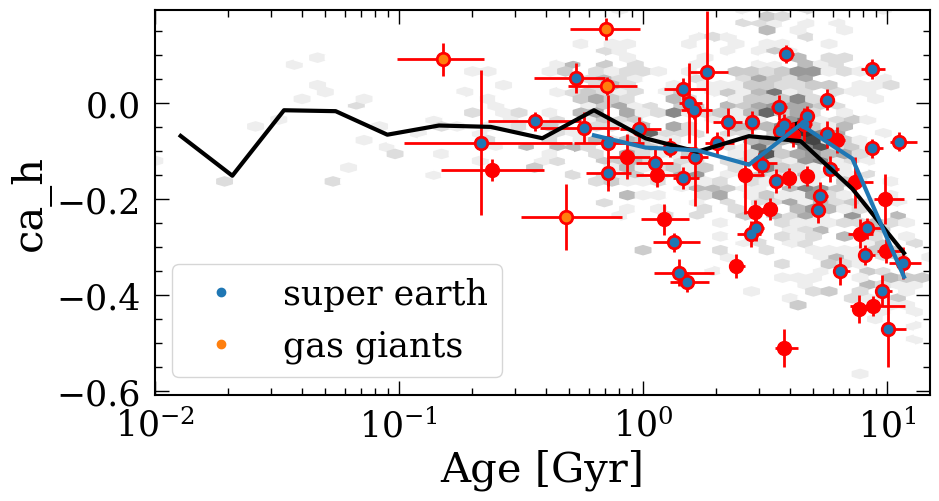

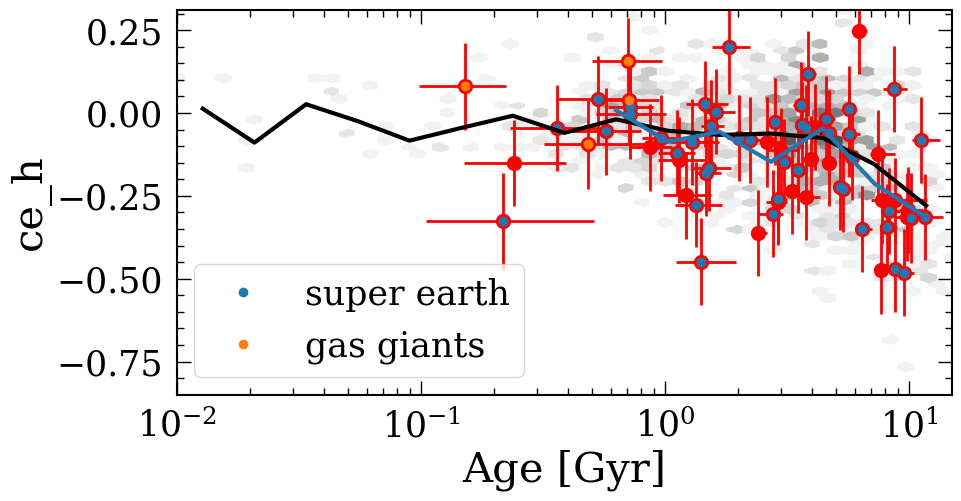

...

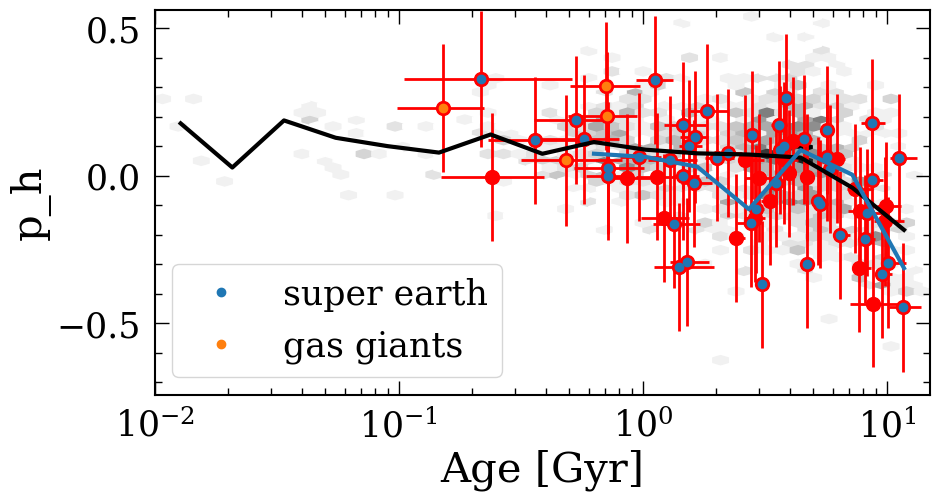

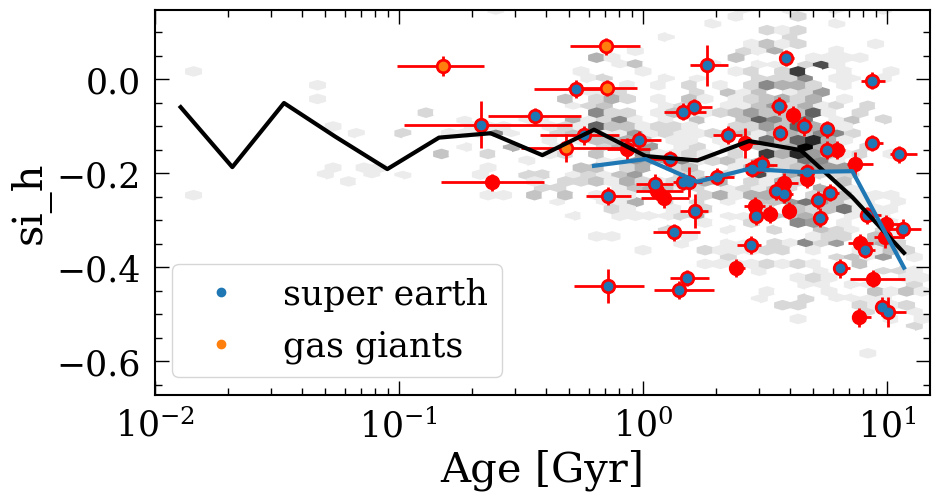

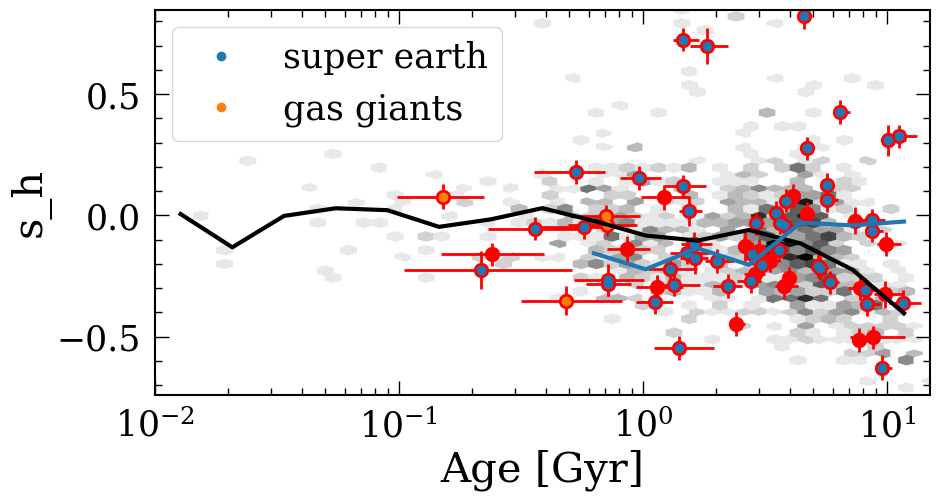

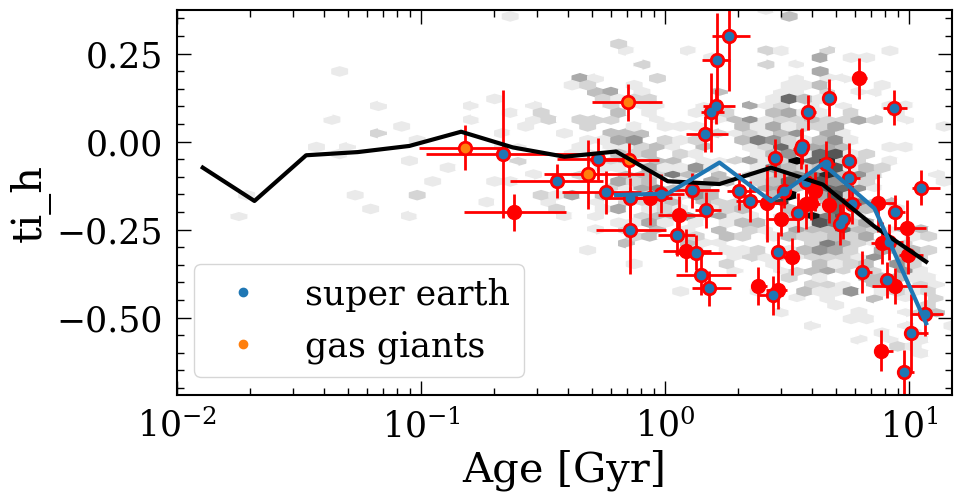

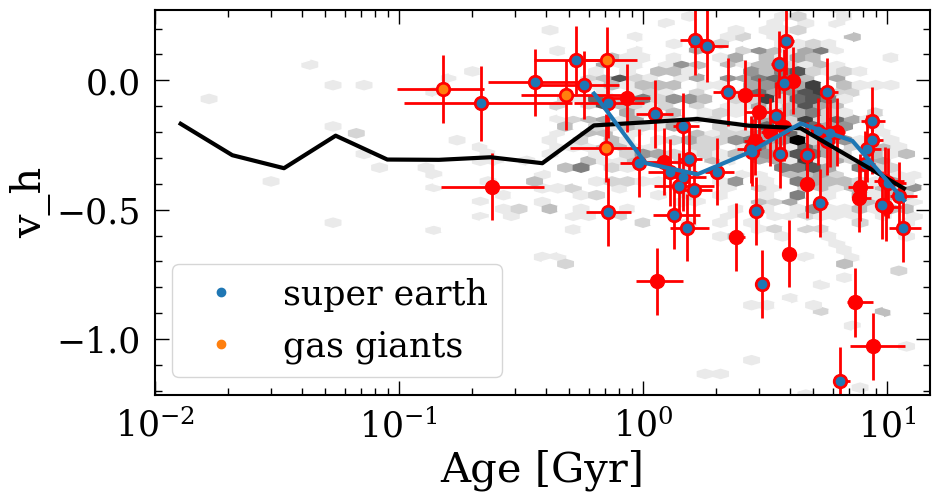

In [107]:
for i in range(len(abund_cols)):
    plt.figure(figsize=(10,5))
    if len(ipl3_gyroage[abund_cols[i]].dropna())==0:
        continue
    
    
    m_p = (ipl3_planet[abund_cols[i]]>-5)
    plt.errorbar(ipl3_planet['age_fit_ind'][m_p], ipl3_planet[abund_cols[i]][m_p], 
                yerr=ipl3_planet[abund_cols_err[i]][m_p], fmt='ro', zorder=2,
                ms=10)
    plt.hlines(ipl3_planet[abund_cols[i]][m_p],
               (ipl3_planet['age_fit_ind']+ipl3_planet['age_fit_ind_m'])[m_p], 
               (ipl3_planet['age_fit_ind']+ipl3_planet['age_fit_ind_p'])[m_p],
              color='r', zorder=2)
    
    m = (ipl3_gyroage[abund_cols[i]]>-5)
    ymin = min([np.percentile(ipl3_gyroage[abund_cols[i]][m].dropna(), 1),
               np.percentile(ipl3_planet[abund_cols[i]][m_p].dropna(), 1)])
    ymax = max([np.percentile(ipl3_gyroage[abund_cols[i]][m].dropna(), 99),
               np.percentile(ipl3_planet[abund_cols[i]][m_p].dropna(), 99)])
    
    
    
    if abund_cols[i]=='n_m_atm':
        plt.ylim([-1, 1])
        plt.hexbin(ipl3_gyroage['age_fit_ind'][m], ipl3_gyroage[abund_cols[i]][m], 
               xscale='log', extent=(-2, np.log10(15), -1, 1), zorder=1, gridsize=50,
                  mincnt=1, cmap='binary')
        
    else:
        plt.hexbin(ipl3_gyroage['age_fit_ind'][m], ipl3_gyroage[abund_cols[i]][m], 
                   xscale='log', extent=(-2, np.log10(15), ymin, ymax), zorder=1, gridsize=50,
                  mincnt=1, cmap='binary')
        plt.ylim([ymin, ymax])
    
    
        
    m2 = (m_p&super_earth)
    plt.plot(ipl3_planet['age_fit_ind'][m2], ipl3_planet[abund_cols[i]][m2], 'o',
               c='C0', zorder=3, label='super earth')
    
    m3 = (m_p&hot_jupiter)
    plt.plot(ipl3_planet['age_fit_ind'][m3], ipl3_planet[abund_cols[i]][m3], 'o',
               c='C1', zorder=3, label='gas giants')
    
    agesbins = np.linspace(np.log10(0.01), np.log10(15), 16)
    ave_y_all = np.ones(len(agesbins)-1)*np.nan
    ave_y_pl = np.ones(len(agesbins)-1)*np.nan
    ave_y_pl_multi = np.ones(len(agesbins)-1)*np.nan
    for j in range(len(agesbins)-1):
        ipl3_gyroage_sing = ipl3_gyroage.loc[(np.log10(ipl3_gyroage['age_fit_ind'])>agesbins[j])&(np.log10(ipl3_gyroage['age_fit_ind'])<agesbins[j+1])]
        ipl3_planet_sing = ipl3_planet[m2].loc[(np.log10(ipl3_planet['age_fit_ind'][m2])>agesbins[j])&(np.log10(ipl3_planet['age_fit_ind'][m2])<agesbins[j+1])]
        ipl3_planet_multi = ipl3_planet[m3].loc[(np.log10(ipl3_planet['age_fit_ind'][m3])>agesbins[j])&(np.log10(ipl3_planet['age_fit_ind'][m3])<agesbins[j+1])]
       
        if len(ipl3_gyroage_sing)>1:
            ave_y_all[j] = np.median(ipl3_gyroage_sing[abund_cols[i]].dropna())
        if len(ipl3_planet_sing)>1:
            ave_y_pl[j] = np.median(ipl3_planet_sing[abund_cols[i]].dropna())
        if len(ipl3_planet_multi)>1:
            ave_y_pl_multi[j] = np.median(ipl3_planet_multi[abund_cols[i]].dropna())
            
    
    plt.plot(np.power(10, agesbins[1:]/2+agesbins[:-1]/2), ave_y_all, 'k-', zorder=4, linewidth=3)
    plt.plot(np.power(10, agesbins[1:]/2+agesbins[:-1]/2), ave_y_pl, '-', color='C0', zorder=4, linewidth=3)
    plt.plot(np.power(10, agesbins[1:]/2+agesbins[:-1]/2), ave_y_pl_multi, '-', color='C1', zorder=4, linewidth=3)

    plt.legend(frameon=True)
    plt.xlabel('Age [Gyr]')
    plt.ylabel(abund_cols[i])
    plt.xlim([0.01,15])
    plt.xscale('log')
    